# Analysis of Clustering Ensemble in Time Series

## 1. Get Data and structure as Time Series

In [1]:
import numpy as np
import pandas as pd
from tslearn.utils import to_time_series_dataset
import tslearn
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import KShape
from sklearn.metrics.cluster import adjusted_rand_score
import matplotlib.pyplot as plt
%matplotlib inline

### Import Data ###
demand_df = pd.read_csv('demand_encode_out.csv')
demand_df.date = pd.DatetimeIndex(demand_df.rpd)
demand_df = demand_df.sort_values(by = ['item_code', 'rpd'])
demand_df.head()



/home/grecia/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  del sys.path[0]


,rpd,item_code,quantity,future_flag,category_code
78,1,1,647.0,0,1
83,1,1,161.0,1,1
88,1,1,30.0,2,1
44,2,1,777.0,0,1
54,2,1,537.0,1,1


In [2]:
### FUNCTIONS THAT WILL BE USE ###

def normalize_data(data):
    X_train = TimeSeriesScalerMeanVariance().fit_transform(data)
    sz = X_train.shape[1]
    return X_train, sz

def k_shape(X_train, n_clusters, seed, verbose=True ):
    # Euclidean k-means
    ks = KShape(n_clusters=n_clusters, verbose=verbose, random_state=seed)

    return ks, ks.fit_predict(X_train)

def compute_scores(ks, X_train, y_pred, centroid=False):
    scores = []
    # range(ks.n_clusters)
    for yi in np.unique(y_pred):
        tp_list = []
        for xx in X_train[y_pred == yi]:

            if centroid:
                predicted = ks.cluster_centers_[yi].ravel()
                actual = xx.ravel()
                score = adjusted_rand_score(actual, predicted)
                scores.append(score)

            else:
                predicted = xx.ravel()
                tp_list.append(predicted)

        if not centroid:
            half = len(tp_list) // 2
            first_half = tp_list[:half]
            second_half = tp_list[half:]

            for i in np.arange(half):
                score = adjusted_rand_score(first_half[i], second_half[i])
                scores.append(score)

    return scores

def plot_data(ks, X_train, y_pred, sz, n_clusters=3, centroid=False):
    # Set the font dictionaries (for plot title and axis titles)
    title_font = {'fontname':'Arial', 'size':'16', 'color':'black', 'weight':'normal',
      'verticalalignment':'bottom'} # Bottom vertical alignment for more space
    axis_font = {'fontname':'Arial', 'size':'14'}

    plt.figure(figsize=(18, 10))
    for yi in range(n_clusters):
        plt.subplot(n_clusters, 1, 1 + yi)
        for xx in X_train[y_pred == yi]:
            # , alpha=.2
            plt.plot(xx.ravel(), "k-")
            # ,
        if centroid:
            plt.plot(ks.cluster_centers_[yi].ravel(), "r-")
        plt.xlim(0, sz)
        # plt.ylim(-4, 4)
        plt.title("Cluster %d" % (yi + 1), **title_font)

    plt.tight_layout()
    plt.show()

In [3]:
### Get structure as Time Series ###
'''The time serie will be the demand requested for each product by month and and future flag'''

#time series per item by rpd
cross_ts_rpd=pd.crosstab(demand_df.item_code, demand_df.rpd, values=demand_df.quantity, aggfunc='sum').fillna(0)
ts_rpd=cross_ts_rpd.values.tolist()

#time series per item by rdp and ff
demand_df['rpd_ff']=demand_df.rpd+(demand_df.future_flag*.1)
cross_ts_rpd_ff=pd.crosstab(demand_df.item_code, demand_df.rpd_ff, values=demand_df.quantity, aggfunc='sum').fillna(0)
ts_rpd_ff=cross_ts_rpd_ff.values.tolist()


#time series per item and ff by rpd 
demand_df['item_ff']=demand_df.item_code+(demand_df.future_flag*.1)
cross_ts_item_ff=pd.crosstab(demand_df.item_ff, demand_df.rpd, values=demand_df.quantity, aggfunc='sum').fillna(0)
ts_item_ff=cross_ts_item_ff.values.tolist()

In [4]:
cross_ts_item_ff.head()

rpd,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
item_ff,,,,,,,,,,,,,,,,,,,,,
1.0,647.0,777.0,936.0,722.0,945.0,712.0,504.0,2100.0,1553.0,869.0,...,1727.0,1300.0,466.0,1718.0,1731.0,1397.0,1563.0,1237.0,1568.0,905.0
1.1,161.0,537.0,757.0,459.0,540.0,453.0,278.0,1760.0,1036.0,718.0,...,1341.0,1243.0,444.0,1162.0,1494.0,1066.0,1250.0,857.0,1019.0,787.0
1.2,30.0,1.0,201.0,55.0,54.0,74.0,164.0,96.0,79.0,19.0,...,283.0,219.0,198.0,224.0,486.0,147.0,191.0,382.0,224.0,528.0
1.3,0.0,0.0,0.0,55.0,0.0,0.0,152.0,96.0,59.0,0.0,...,187.0,114.0,103.0,221.0,404.0,87.0,103.0,291.0,158.0,5.0
2.0,6845.0,6096.0,11646.0,7001.0,8497.0,9584.0,5124.0,8135.0,7260.0,8003.0,...,10074.0,5191.0,3266.0,4714.0,6027.0,9518.0,14230.0,9036.0,4970.0,5285.0


## 2. Compute Base Clusterings

In [18]:
### Find the righ number of k ###
'''We will use Elbow text to find what is the k in this data'''

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

num_clusters_list = np.arange(2,50,5)
cluster_errors = []
cluster_silhouette=[]
formatted_dataset = to_time_series_dataset(ts_item_ff)
X_train, sz = normalize_data(formatted_dataset)


for num_clusters in num_clusters_list:
    clusters = tslearn.clustering.KShape(n_clusters=num_clusters, max_iter=5, verbose=False, random_state=0)
    clusters.fit( X_train )
    cluster_labels = clusters.fit_predict(X_train)
    silhouette_avg = tslearn.clustering.silhouette_score(X_train, cluster_labels, metric="euclidean")
    print("For n_clusters =", num_clusters,
        "The average silhouette_score is :", silhouette_avg)
    cluster_errors.append( clusters.inertia_ )
    cluster_silhouette.append(silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.01043664062768788
For n_clusters = 7 The average silhouette_score is : -0.003888093273852275
For n_clusters = 12 The average silhouette_score is : -0.03888073424455646
For n_clusters = 17 The average silhouette_score is : -0.04837686997078919
For n_clusters = 22 The average silhouette_score is : -0.05677114331746498
For n_clusters = 27 The average silhouette_score is : -0.039263024103246884
For n_clusters = 32 The average silhouette_score is : -0.050611602811918455
For n_clusters = 37 The average silhouette_score is : -0.05129795988210971
For n_clusters = 42 The average silhouette_score is : -0.049235413665868415
For n_clusters = 47 The average silhouette_score is : -0.051969122996522524


Text(0, 0.5, 'Cluster errors (inertia)')

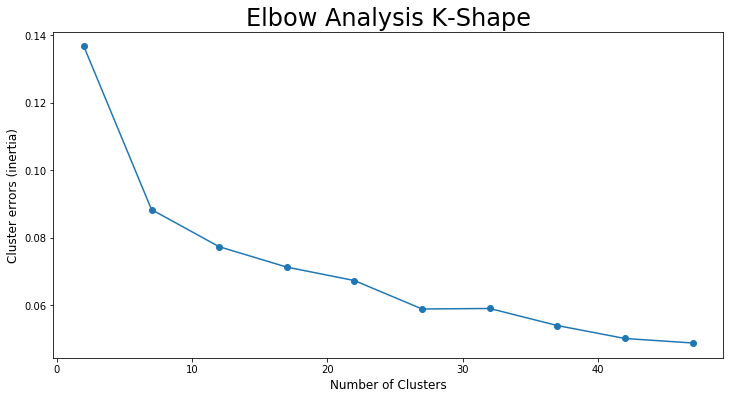

In [19]:
clusters_df = pd.DataFrame( { "num_clusters":num_clusters_list, "cluster_errors": cluster_errors, "cluster_silhouette": cluster_silhouette } )

plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )
plt.title('Elbow Analysis K-Shape',fontsize=24)
plt.xlabel("Number of Clusters", fontsize=12)
plt.ylabel("Cluster errors (inertia)", fontsize=12)

0.093 --> 0.076 --> 0.073 --> 0.071 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.04837686997078919


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


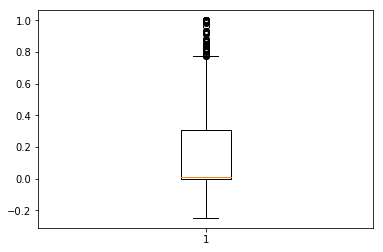

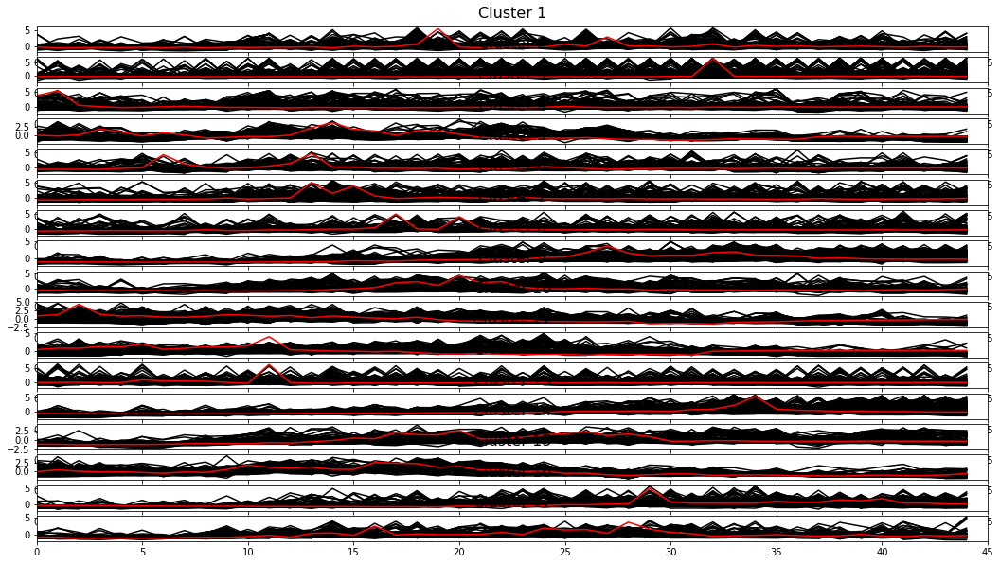

0.092 --> 0.078 --> 0.074 --> 0.073 --> 0.072 --> 0.071 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.030154760728213204


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


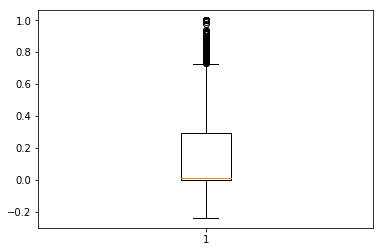

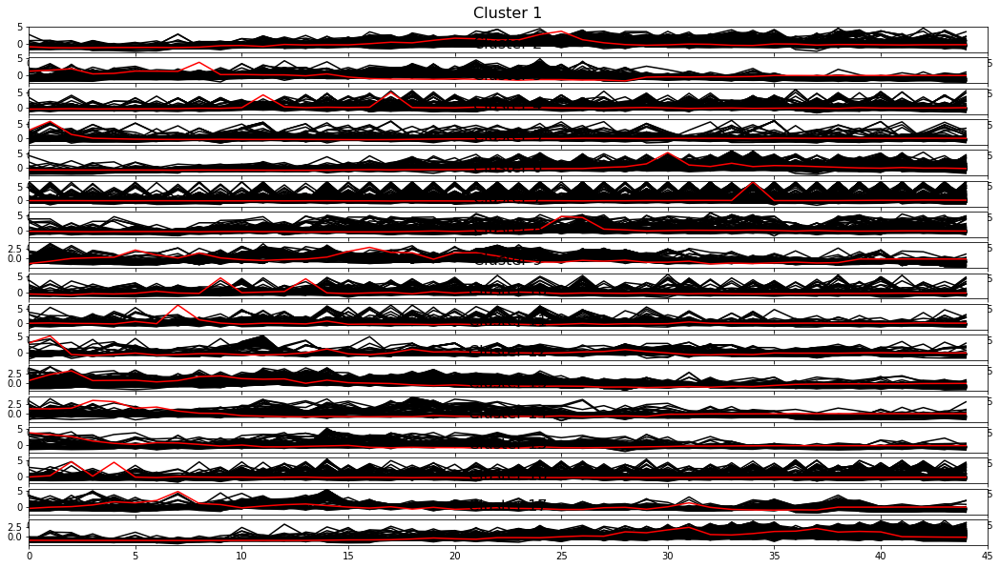

0.096 --> 0.080 --> 0.075 --> 0.073 --> 0.070 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.027087271357535962


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


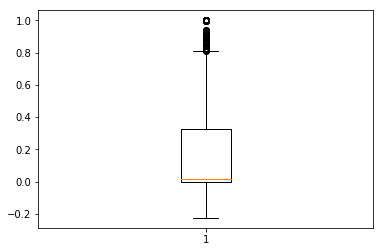

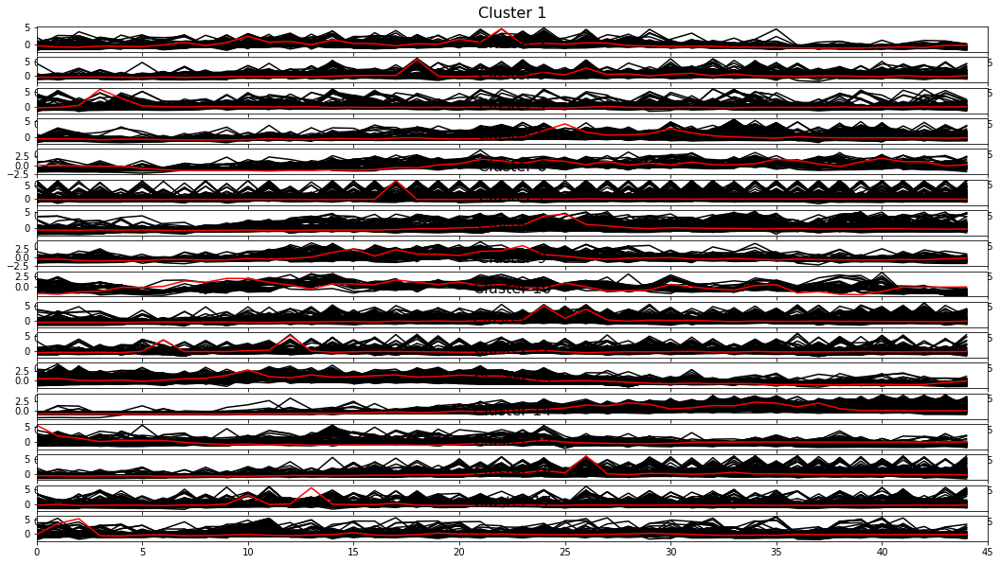

0.090 --> 0.076 --> 0.073 --> 0.071 --> 0.071 --> Resumed because of empty cluster
0.095 --> 0.078 --> 0.072 --> 0.070 --> 0.069 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.05626902495254528


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


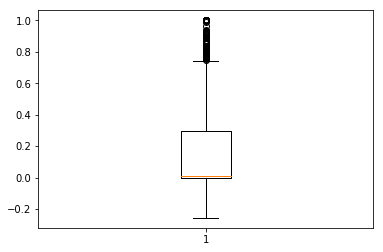

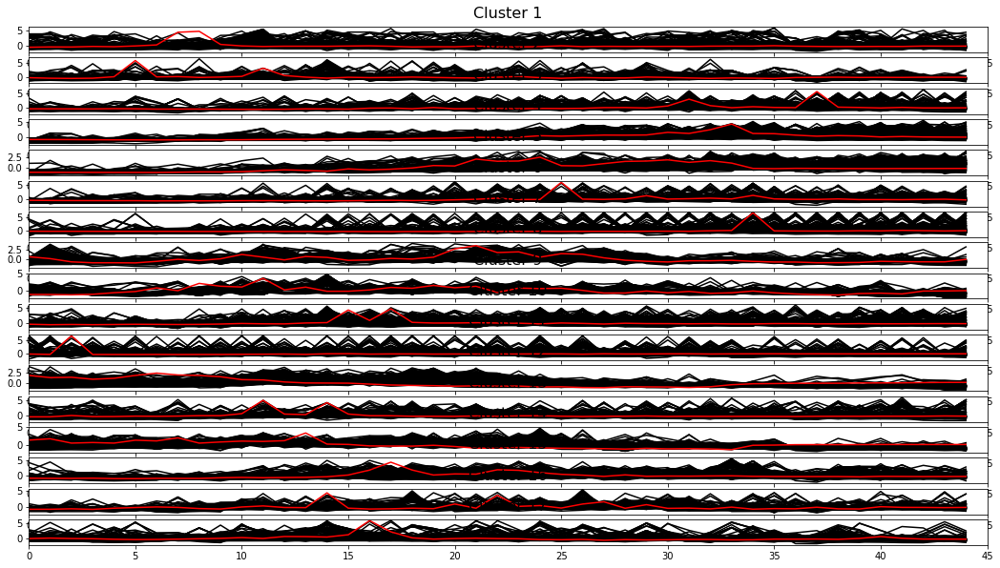

0.091 --> 0.077 --> 0.072 --> 0.071 --> 0.070 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.02669590115233532


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


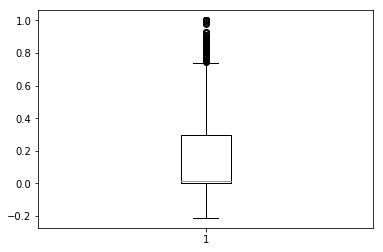

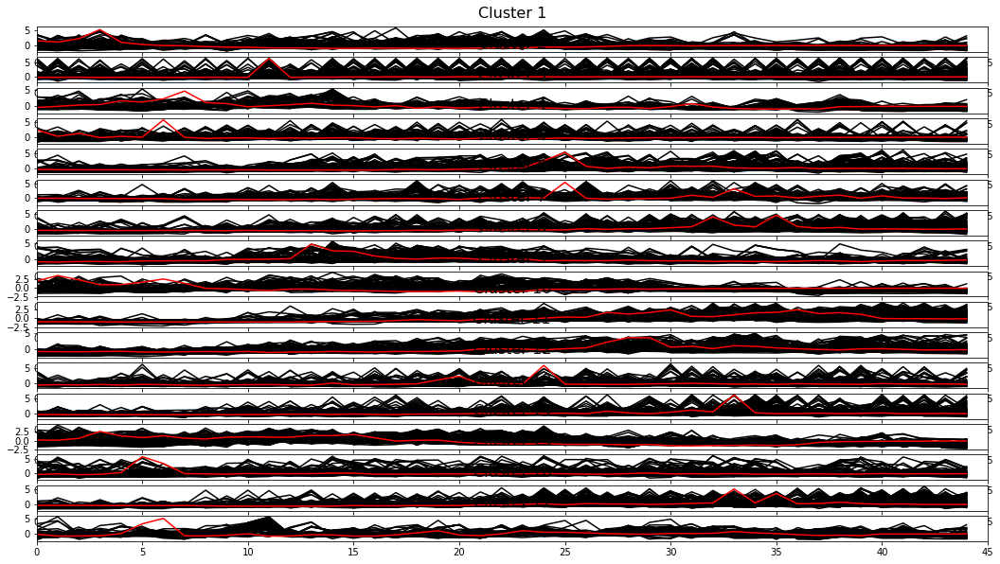

0.089 --> 0.076 --> 0.072 --> 0.069 --> 0.068 --> 0.068 --> 0.067 --> 0.067 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.030526107240525475


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


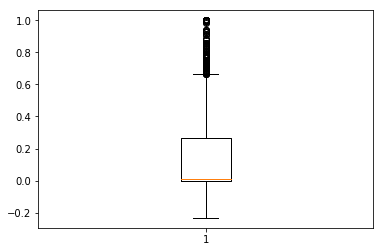

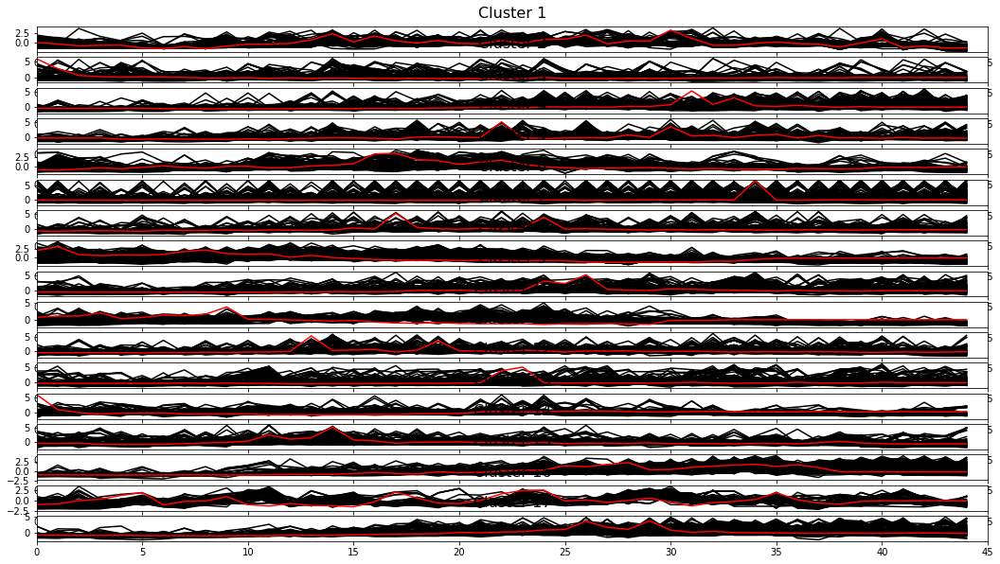

0.092 --> 0.076 --> 0.072 --> 0.070 --> 0.069 --> 0.068 --> 0.067 --> 0.067 --> 
For n_clusters = 17 The average silhouette_score is : -0.04559652821620148


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


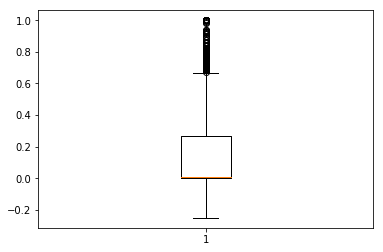

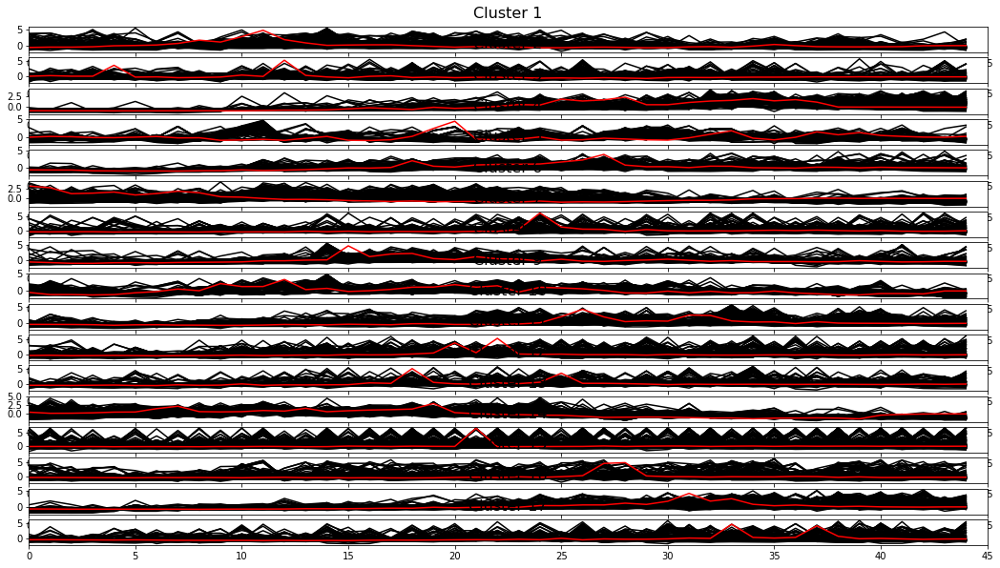

0.096 --> 0.076 --> 0.075 --> 0.072 --> 0.070 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.018548251132584136


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


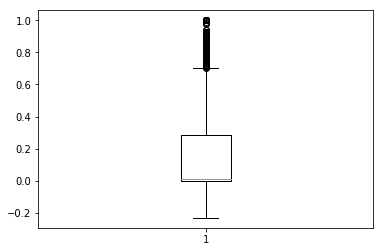

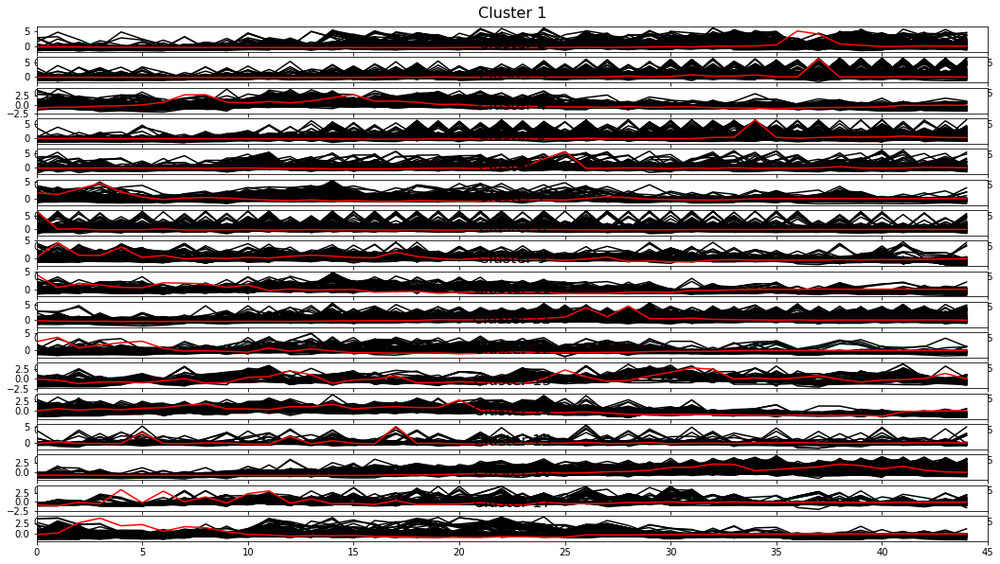

0.092 --> 0.077 --> 0.073 --> 0.072 --> 0.070 --> 0.068 --> 0.068 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.04710143344501442


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


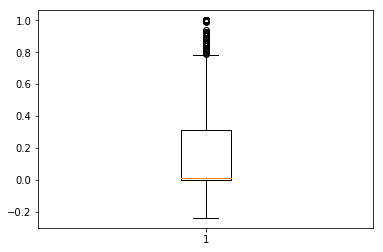

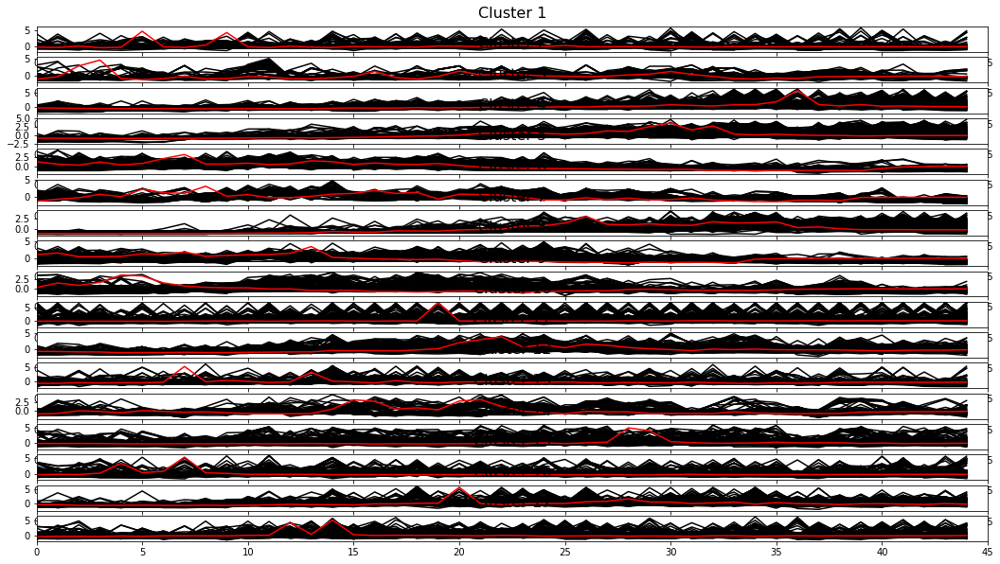

0.092 --> 0.078 --> 0.075 --> 0.073 --> 0.072 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.05675829263492831


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


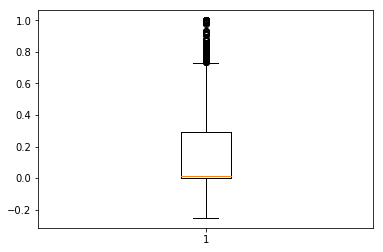

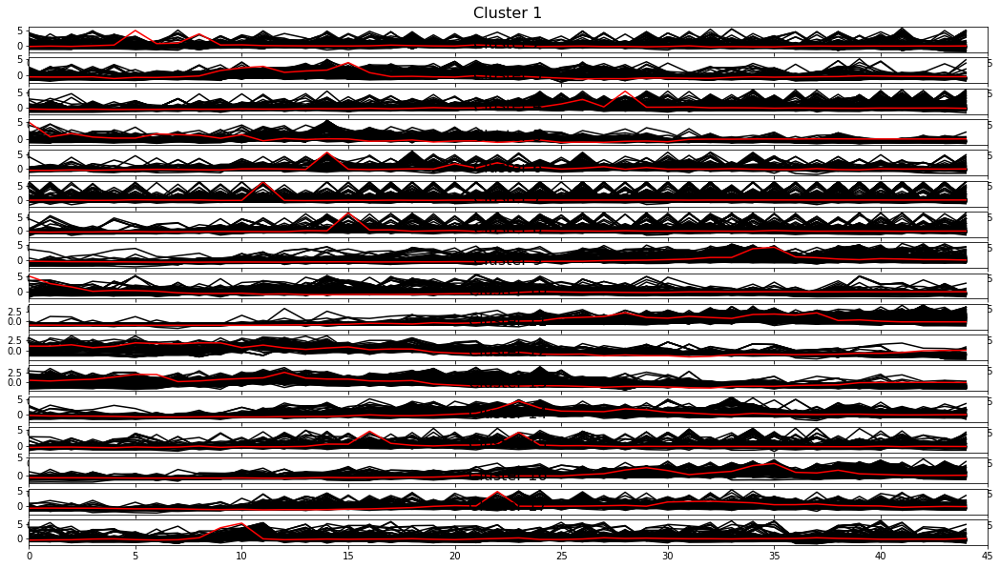

0.098 --> 0.075 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.05429856504460574


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


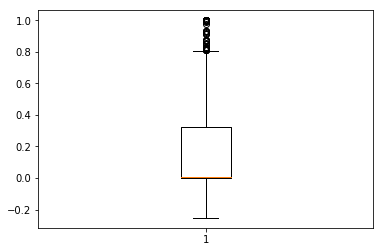

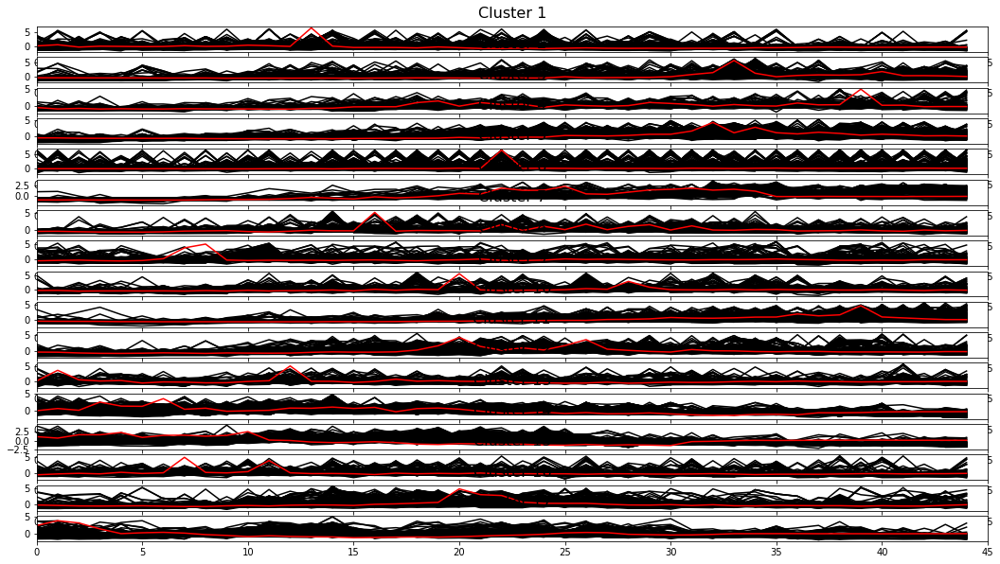

0.091 --> 0.076 --> 0.072 --> 0.070 --> 0.069 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.04876406405117728


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


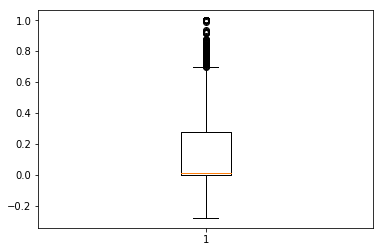

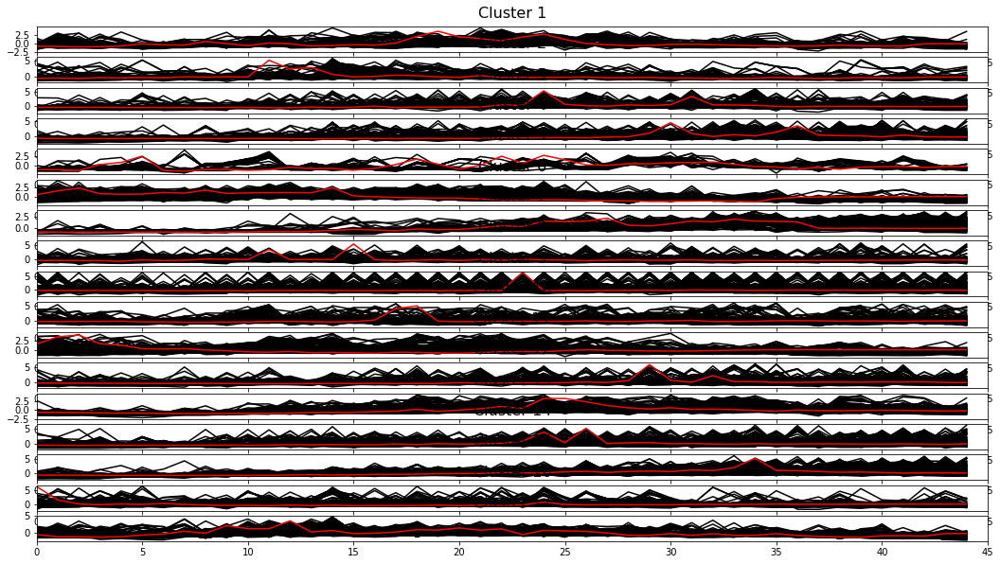

0.091 --> 0.078 --> 0.074 --> 0.073 --> 0.073 --> 
For n_clusters = 17 The average silhouette_score is : -0.03810307276933952


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


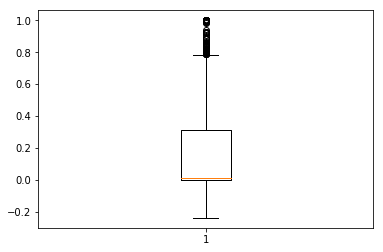

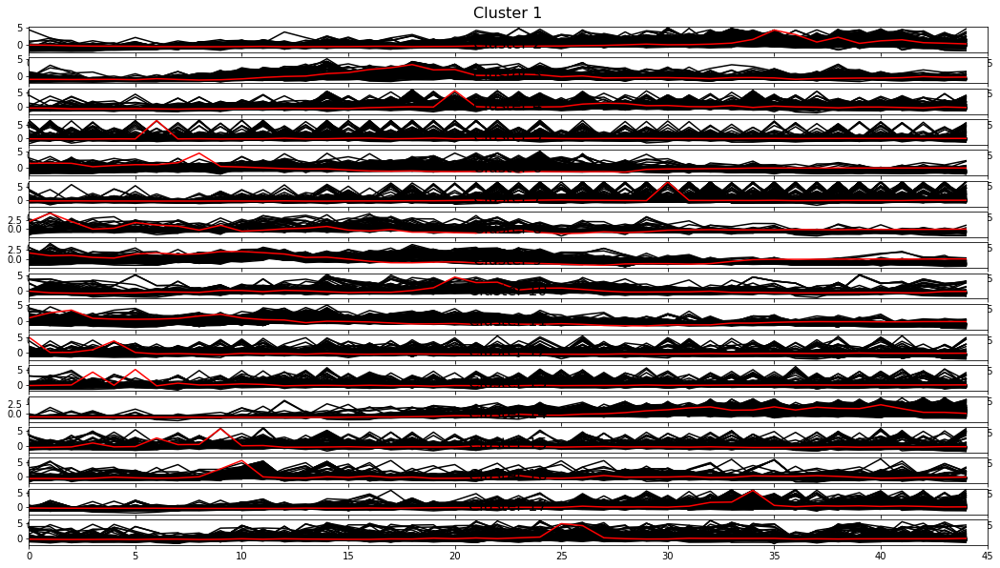

0.097 --> 0.081 --> 0.074 --> 0.071 --> 0.070 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.0225461725965289


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


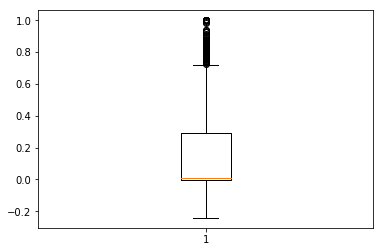

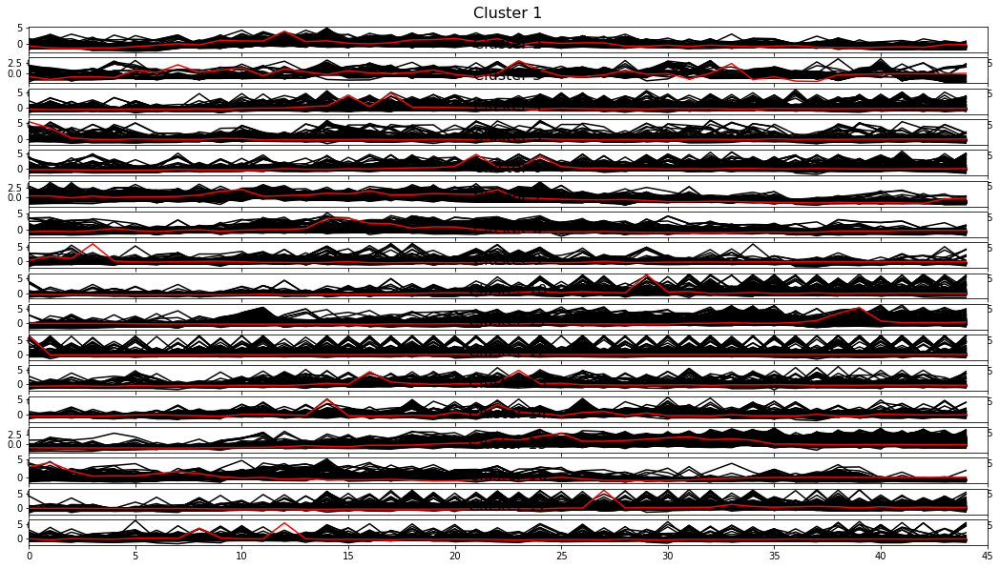

0.094 --> 0.078 --> 0.073 --> 0.072 --> 0.070 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.031190019388500627


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


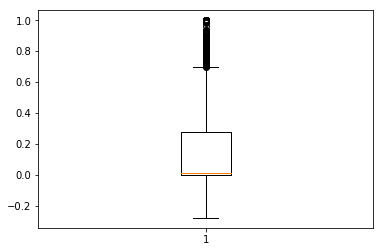

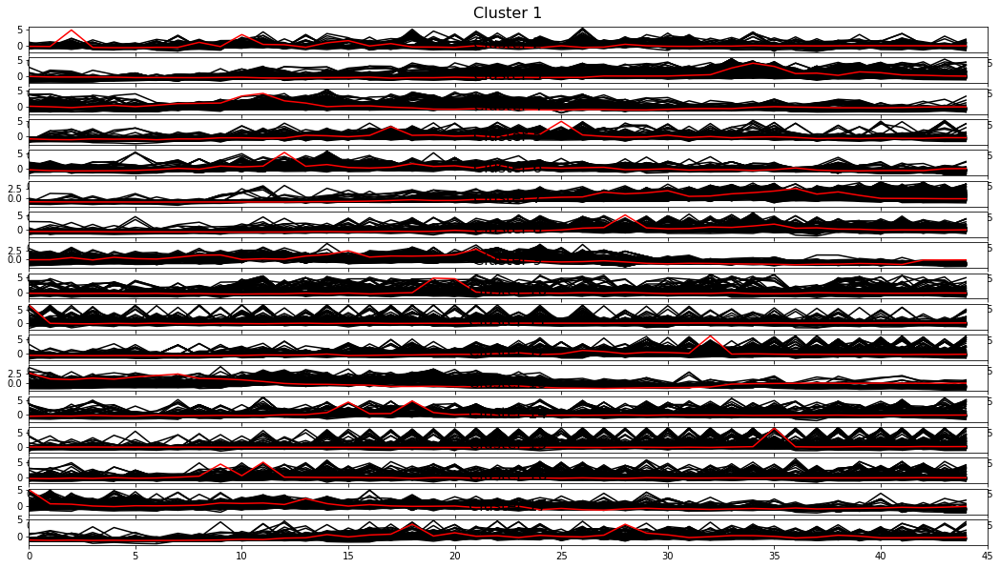

0.091 --> 0.077 --> 0.073 --> 0.071 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.04833036917842794


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


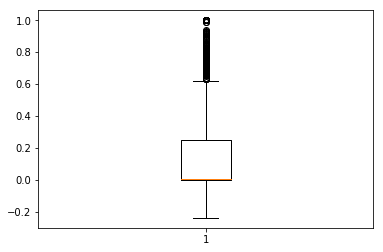

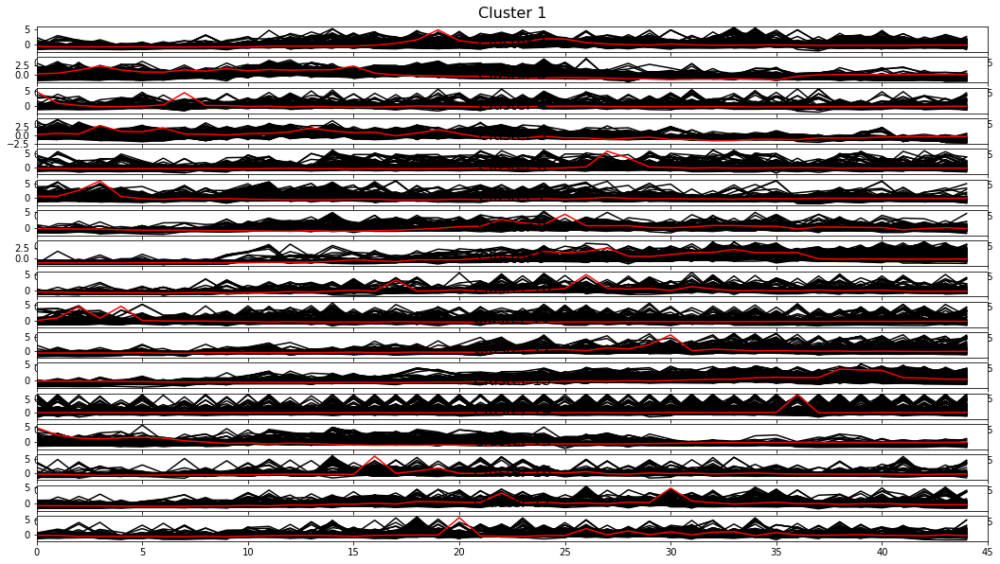

0.094 --> 0.078 --> 0.073 --> 0.071 --> 0.070 --> 0.069 --> 0.068 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.06509037729090815


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


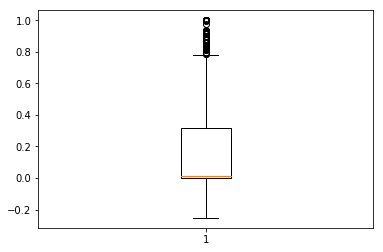

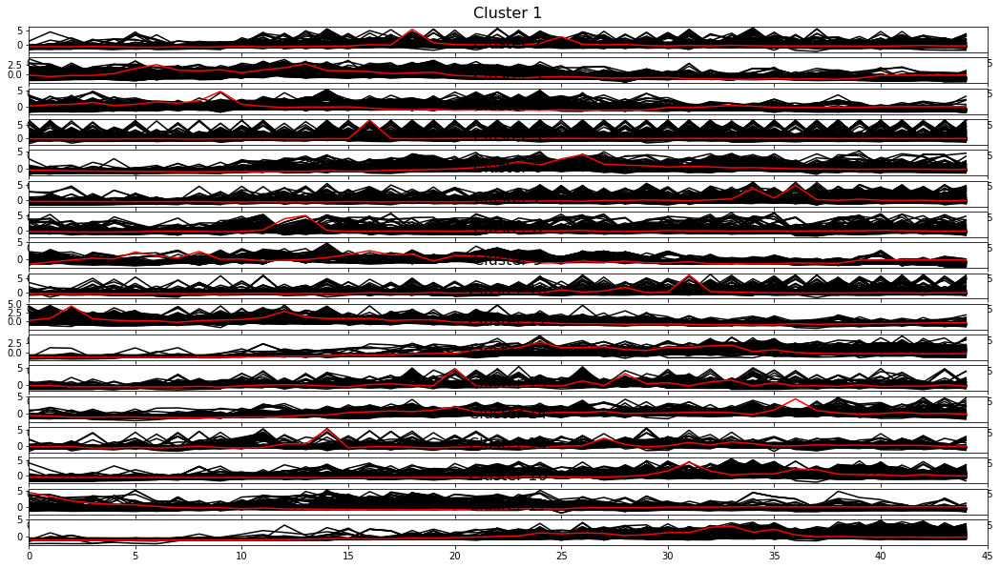

0.087 --> 0.075 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.039104517688884906


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


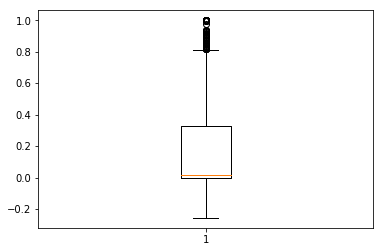

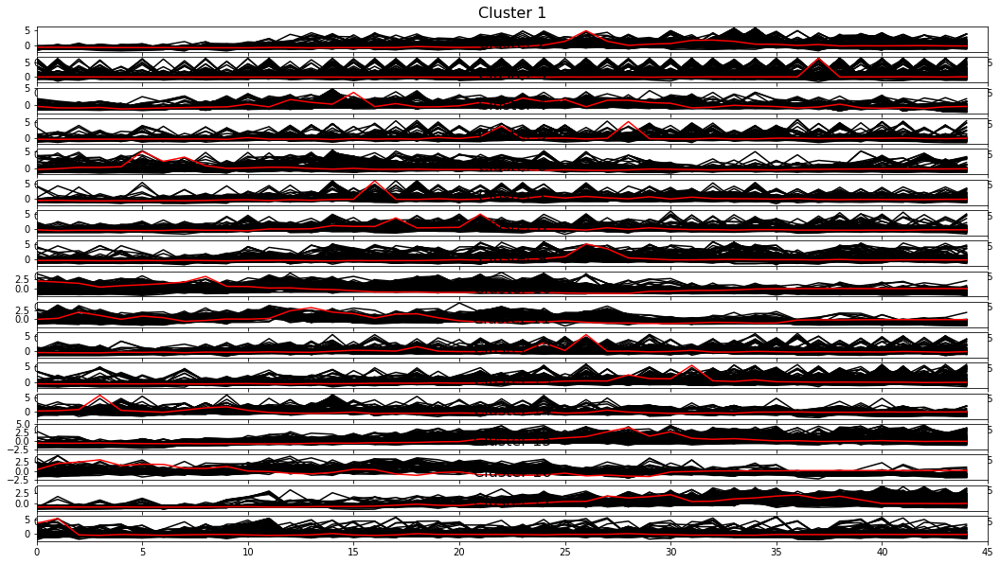

0.093 --> 0.076 --> 0.073 --> 0.072 --> 0.070 --> 0.070 --> 0.068 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.03066204922631803


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


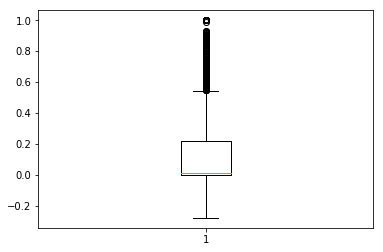

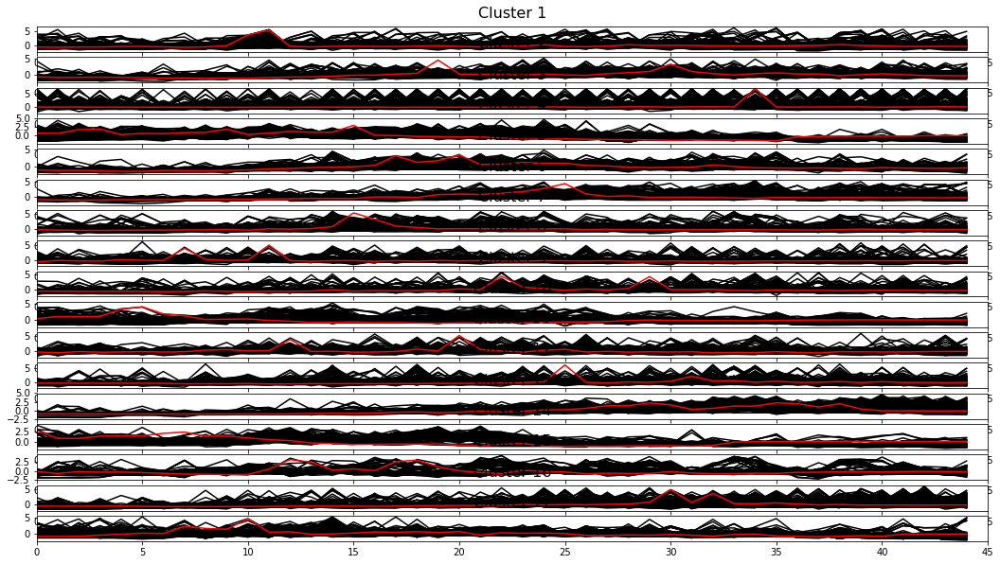

0.089 --> 0.074 --> 0.071 --> 0.071 --> 0.071 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.05131440916541904


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


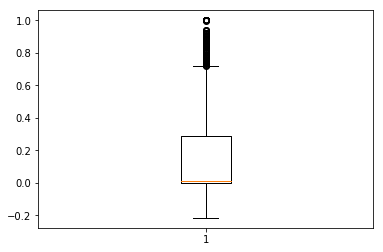

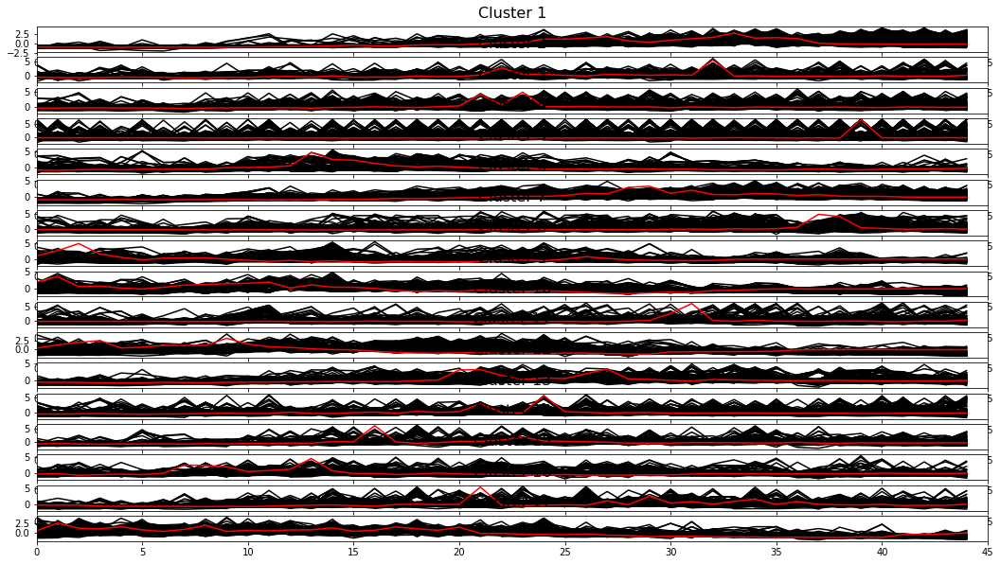

0.092 --> 0.076 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 0.068 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.048626552932779454


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


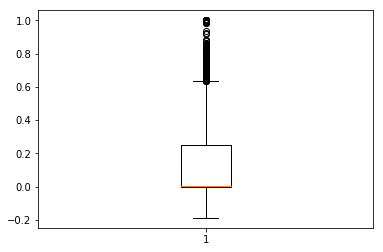

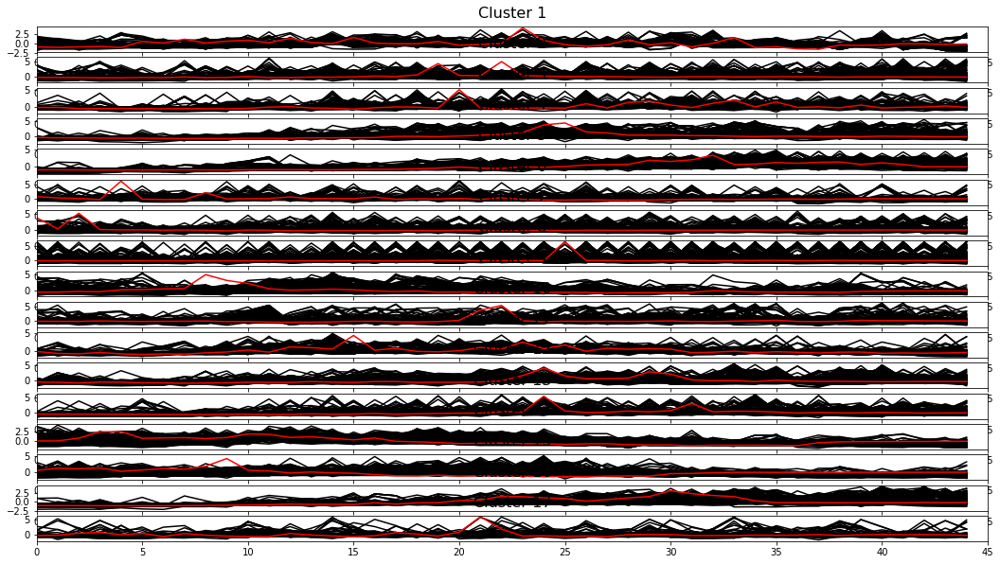

0.091 --> 0.077 --> 0.072 --> 0.070 --> 0.070 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.056151386971888075


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


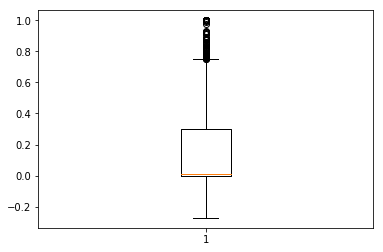

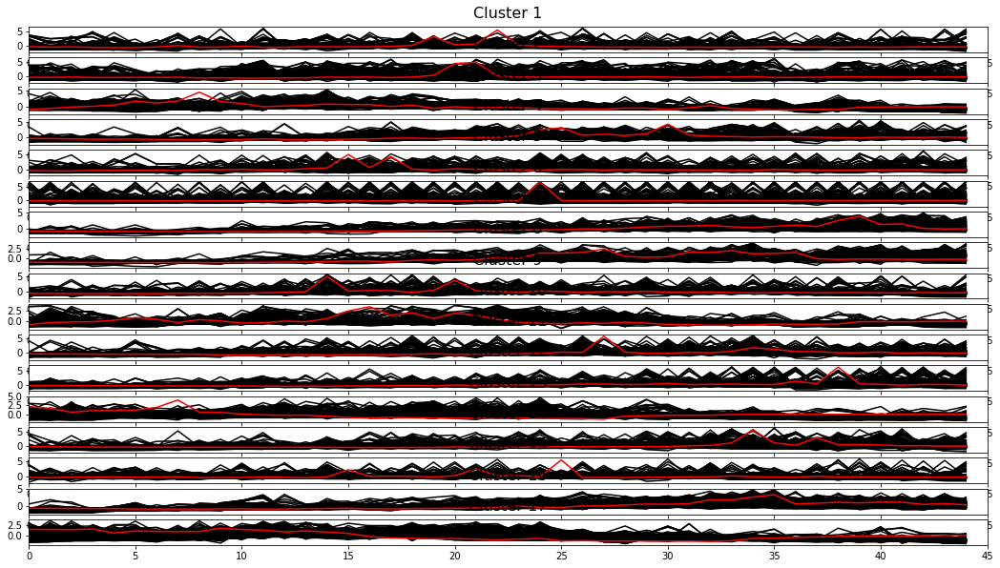

0.088 --> 0.076 --> 0.072 --> 0.070 --> 0.069 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.040951311455557124


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


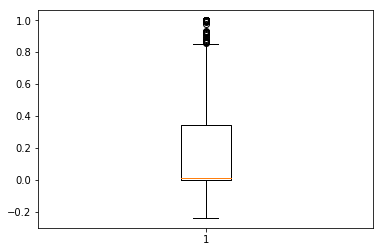

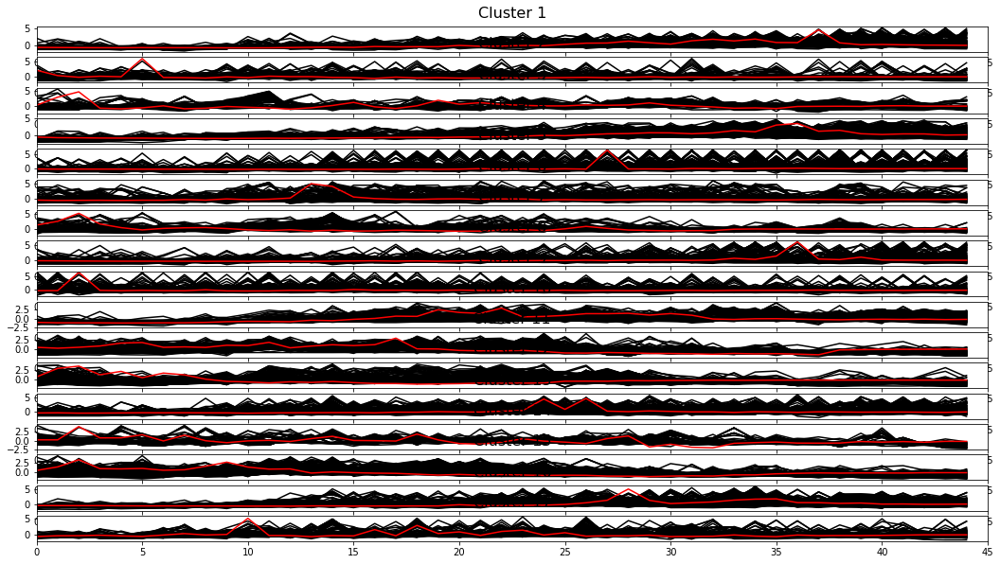

0.092 --> 0.077 --> 0.073 --> 0.071 --> 0.070 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.046270588708511404


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


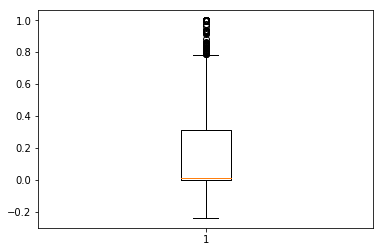

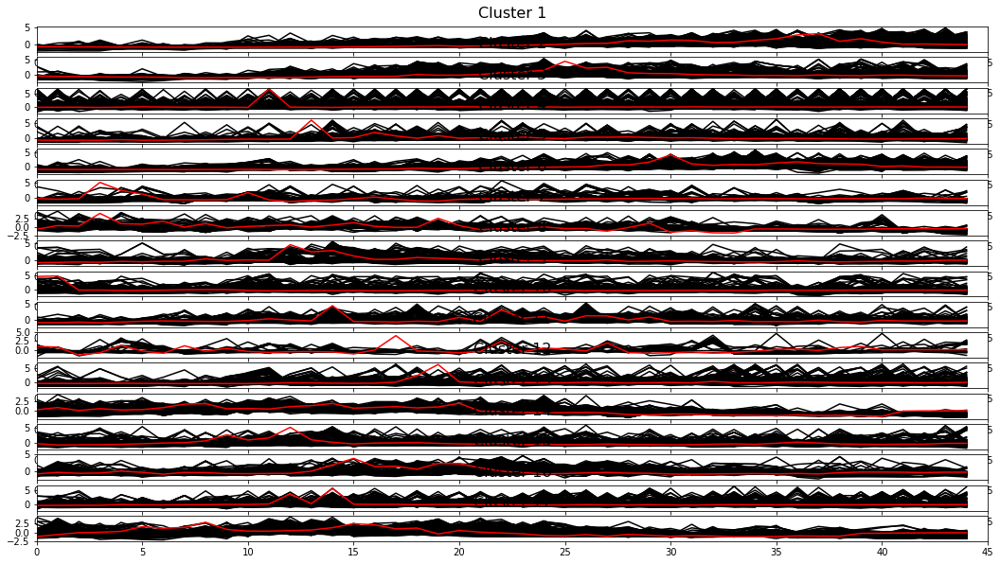

0.091 --> 0.076 --> 0.073 --> 0.070 --> 0.069 --> 0.068 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.03638196496130481


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


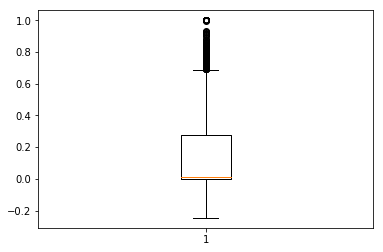

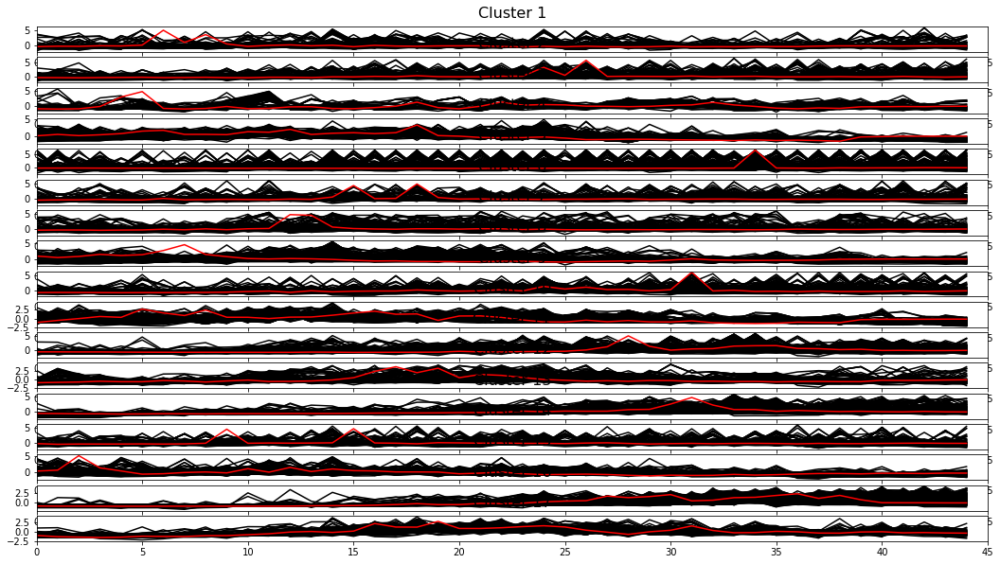

0.095 --> 0.077 --> 0.072 --> 0.070 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.0453272433019465


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


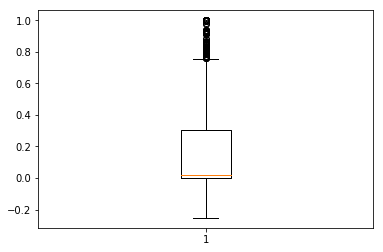

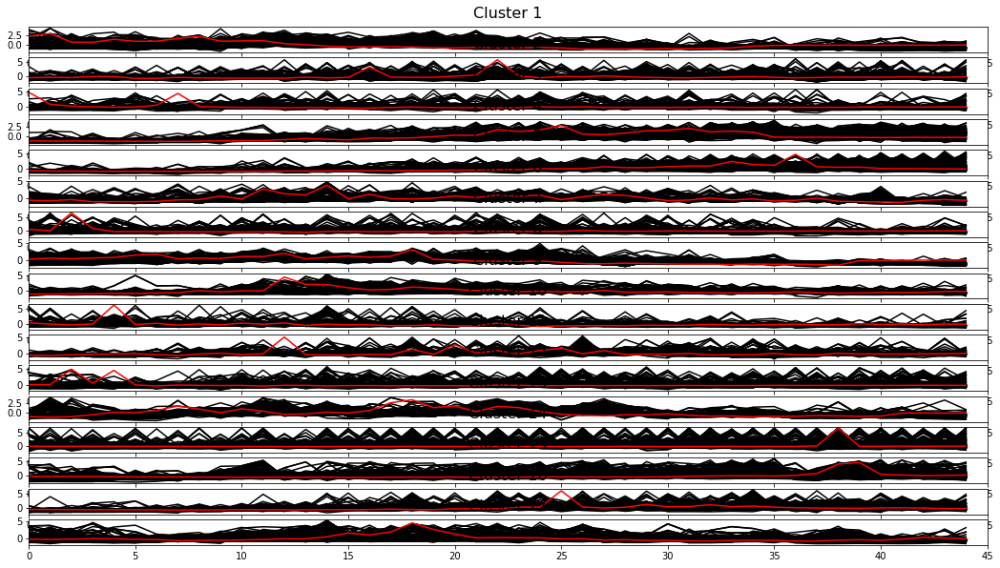

0.094 --> 0.077 --> 0.072 --> 0.069 --> 0.067 --> 0.066 --> 0.067 --> 
For n_clusters = 17 The average silhouette_score is : -0.03606327699675022


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


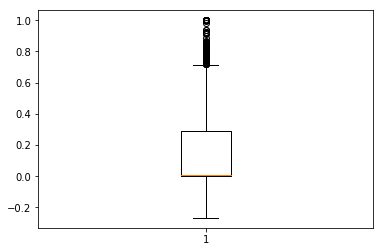

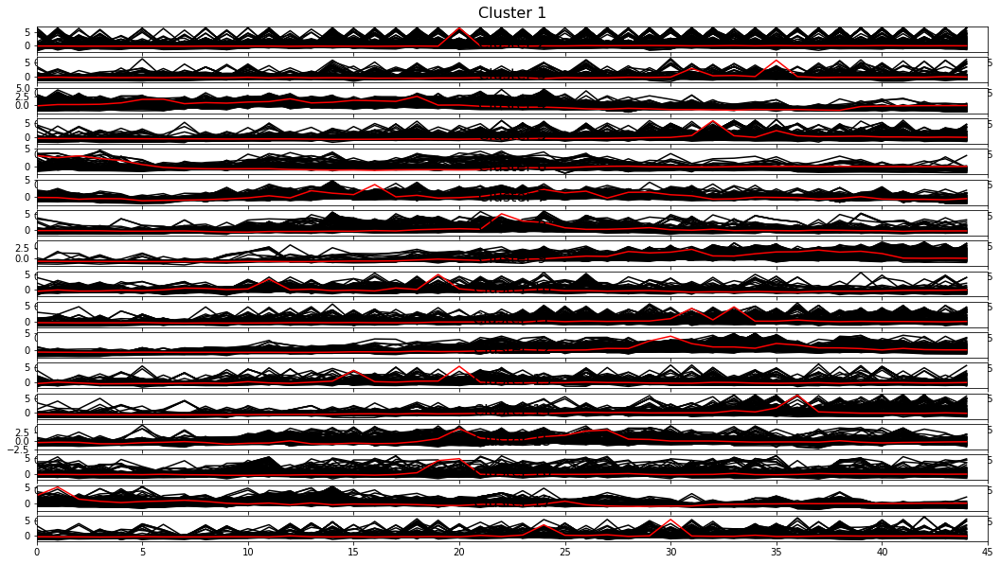

0.092 --> 0.077 --> 0.073 --> 0.072 --> 0.070 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.04286339408063412


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


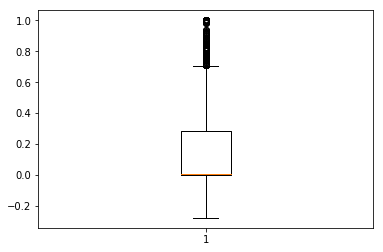

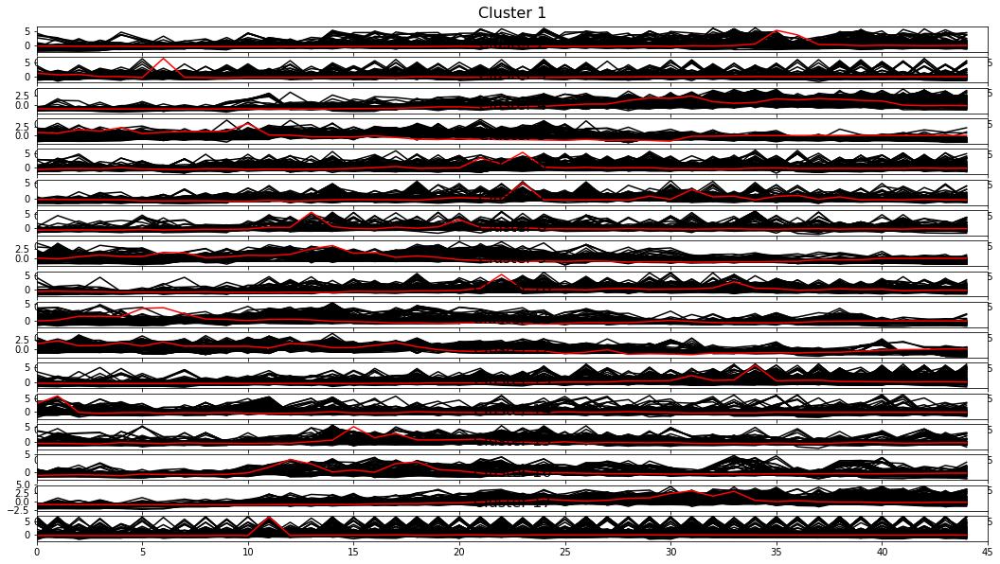

0.090 --> 0.075 --> 0.071 --> 0.070 --> 0.069 --> 0.069 --> 0.069 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.053841822389070274


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


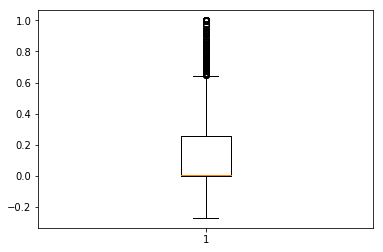

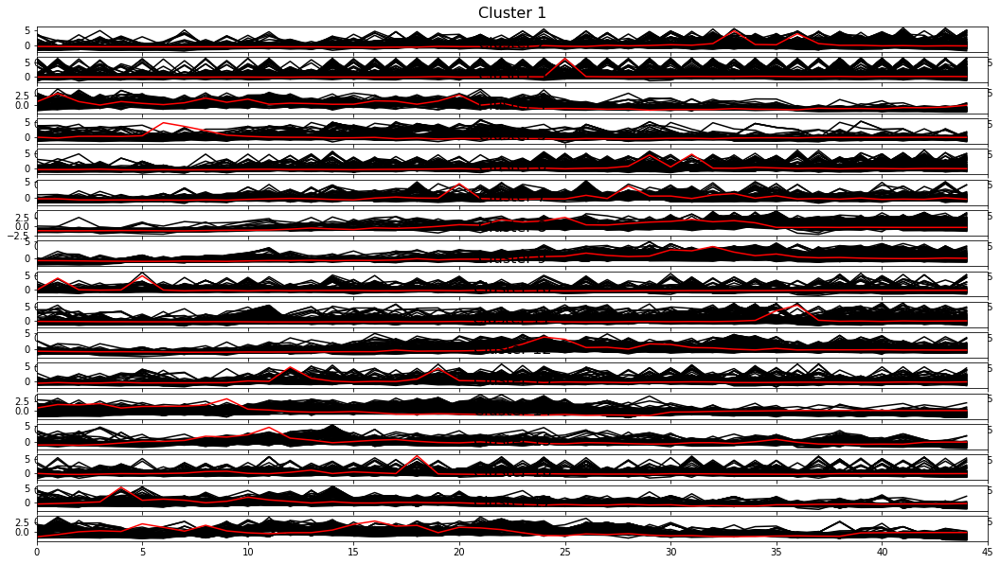

0.093 --> 0.076 --> 0.071 --> 0.069 --> 0.069 --> 0.068 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.03875583147628511


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


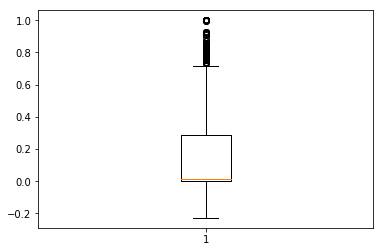

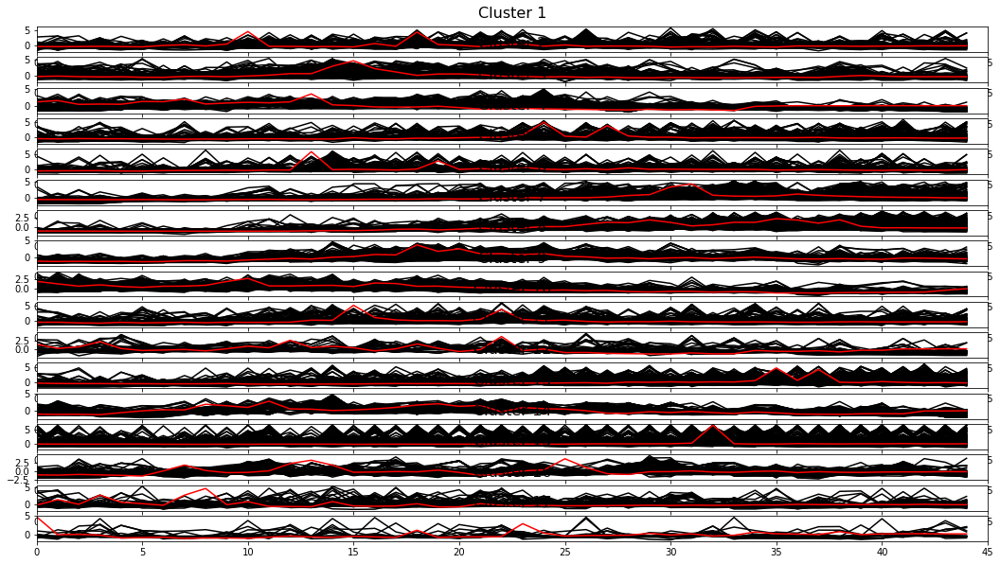

0.094 --> 0.076 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.0547092979112756


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


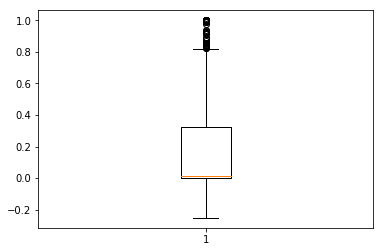

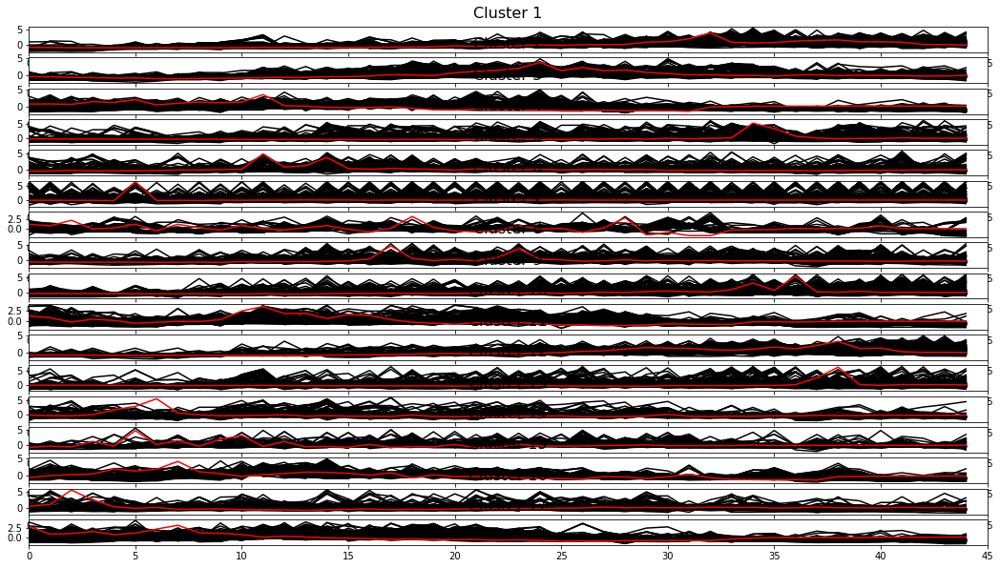

0.094 --> 0.077 --> 0.073 --> 0.071 --> 0.070 --> 0.070 --> 0.069 --> 0.069 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.024970715984359775


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


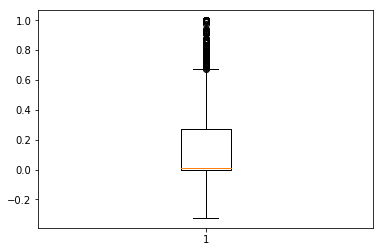

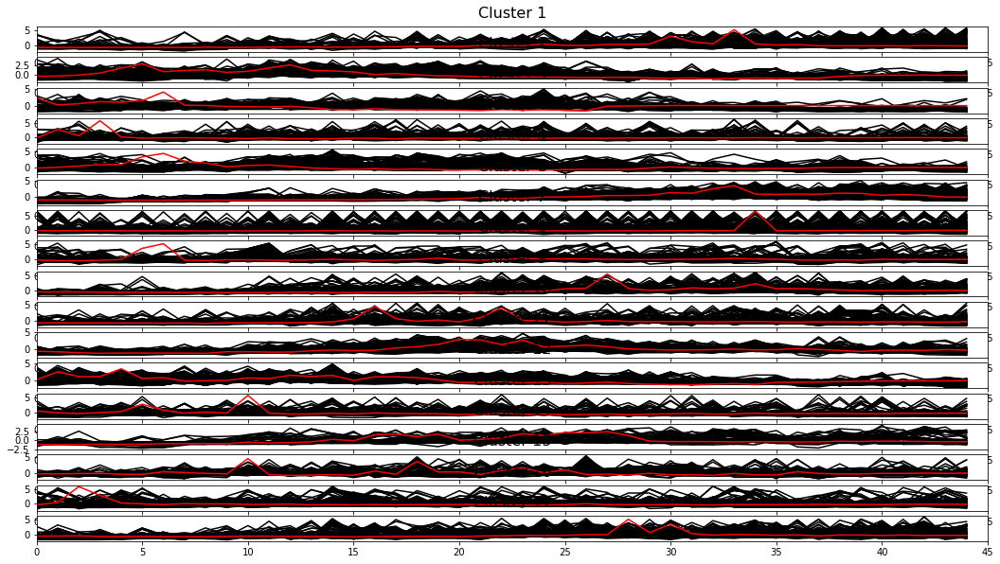

0.089 --> 0.075 --> 0.071 --> 0.071 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.057764125639363464


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


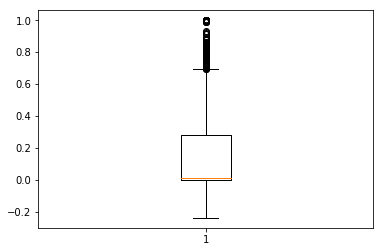

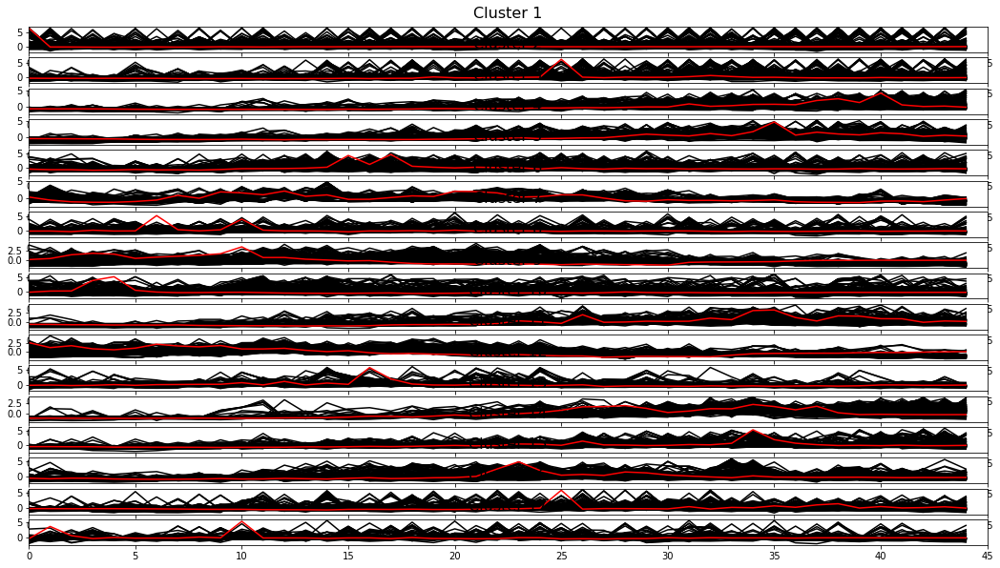

0.092 --> 0.078 --> 0.073 --> 0.071 --> 0.070 --> 0.069 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.04368046885004355


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


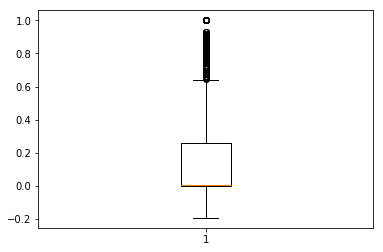

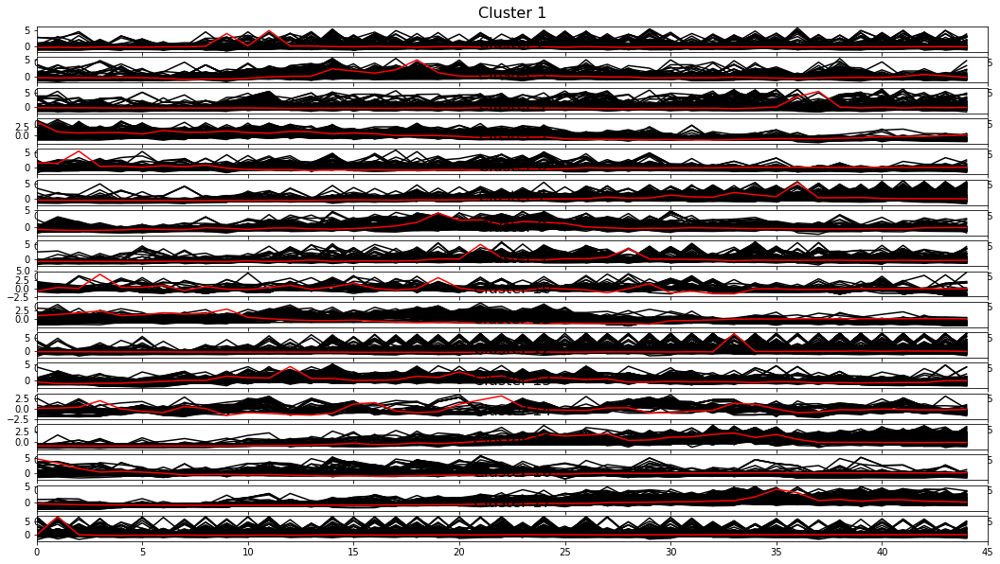

0.093 --> 0.079 --> 0.073 --> 0.073 --> 0.072 --> 0.071 --> 0.071 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.04970161246222122


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


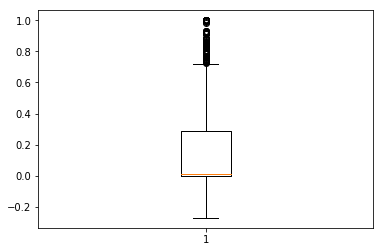

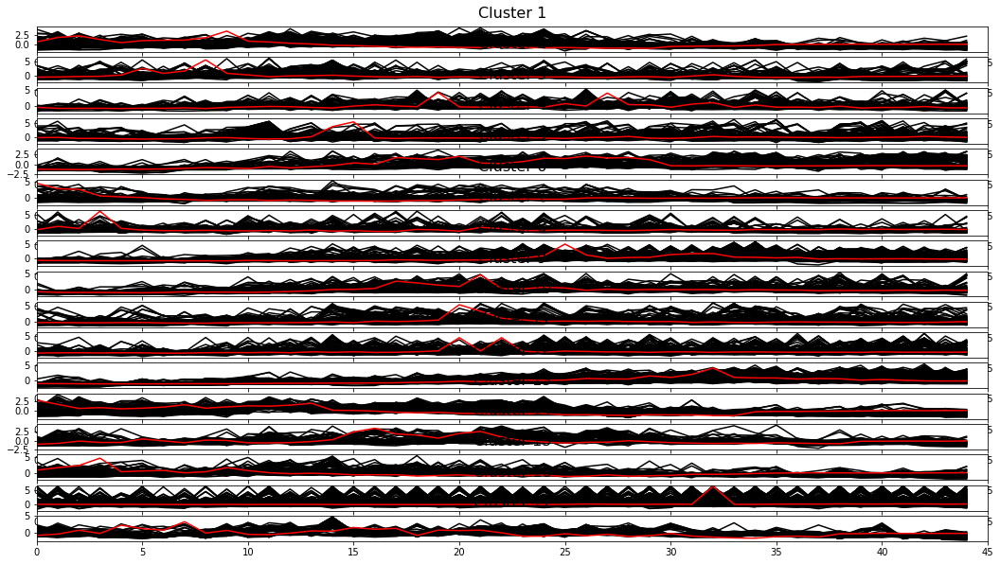

0.093 --> 0.078 --> 0.073 --> 0.072 --> 0.070 --> 0.071 --> 
For n_clusters = 17 The average silhouette_score is : -0.043485273518677516


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


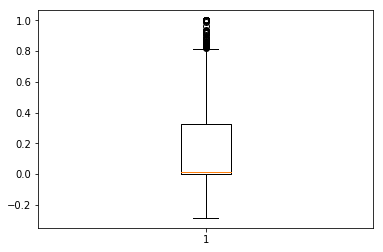

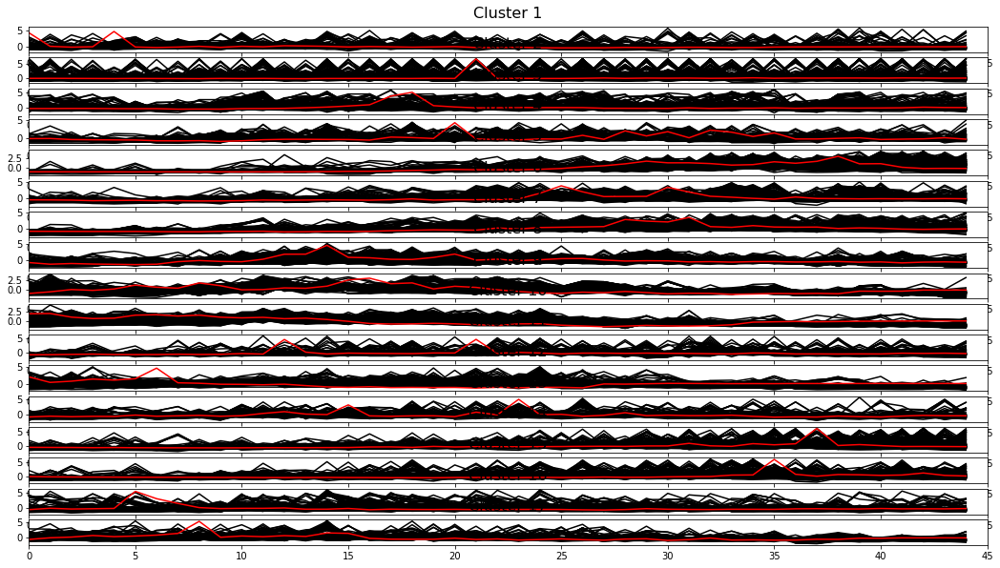

0.098 --> 0.080 --> 0.073 --> 0.071 --> 0.070 --> 0.070 --> 0.070 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.05088985423778773


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


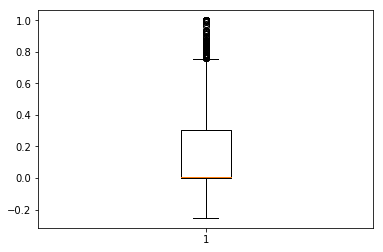

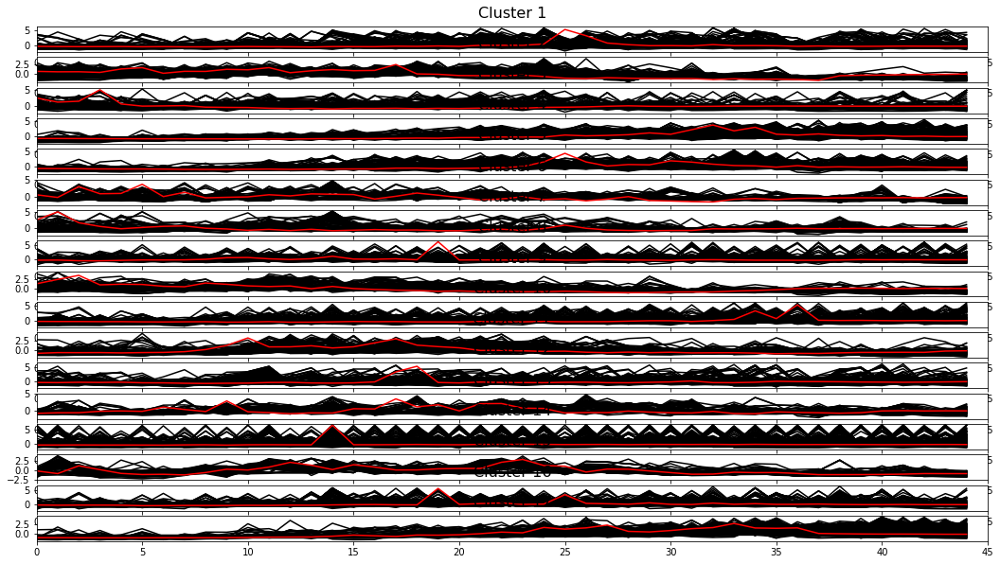

0.094 --> 0.080 --> 0.076 --> 0.074 --> 0.073 --> 0.074 --> 
For n_clusters = 17 The average silhouette_score is : -0.04985381928483945


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


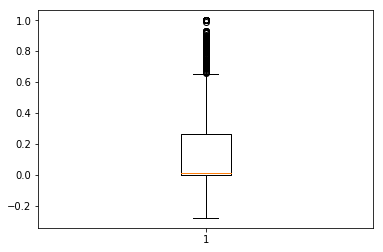

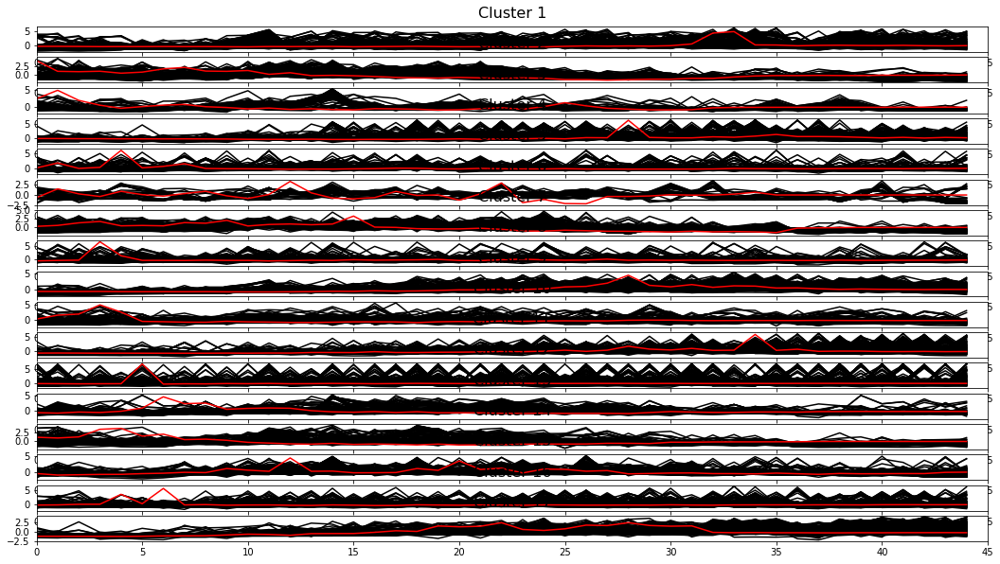

0.090 --> 0.078 --> 0.074 --> 0.077 --> 
For n_clusters = 17 The average silhouette_score is : -0.05107461684088472


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


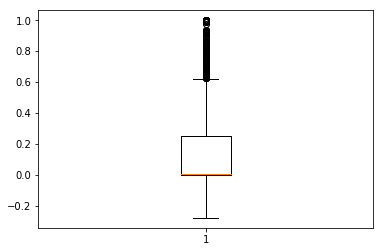

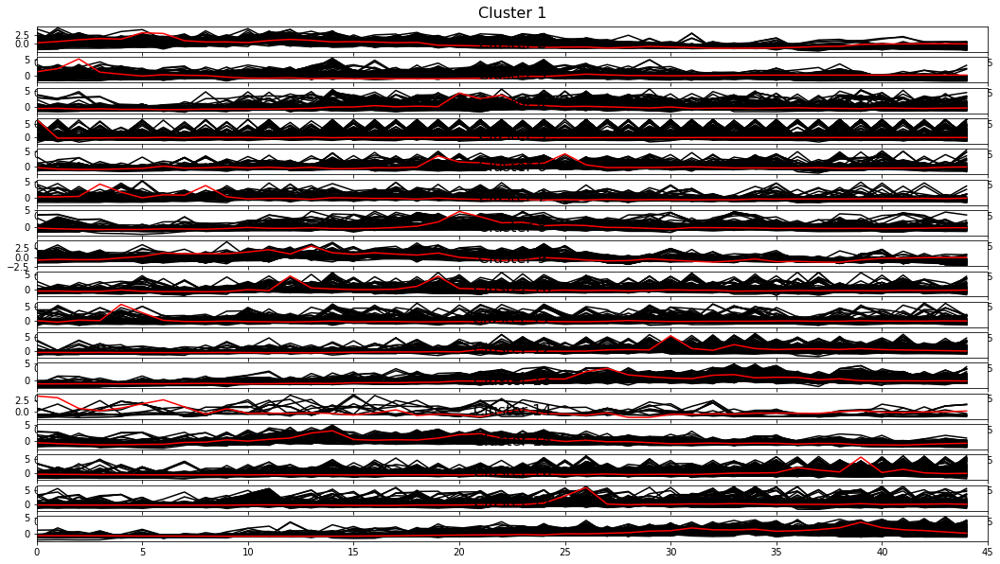

0.092 --> 0.081 --> 0.073 --> 0.070 --> 0.069 --> 0.068 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.03617187275453589


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


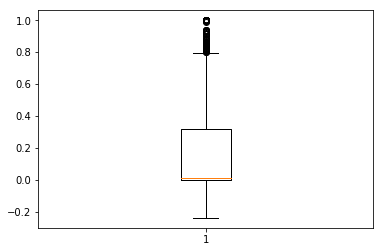

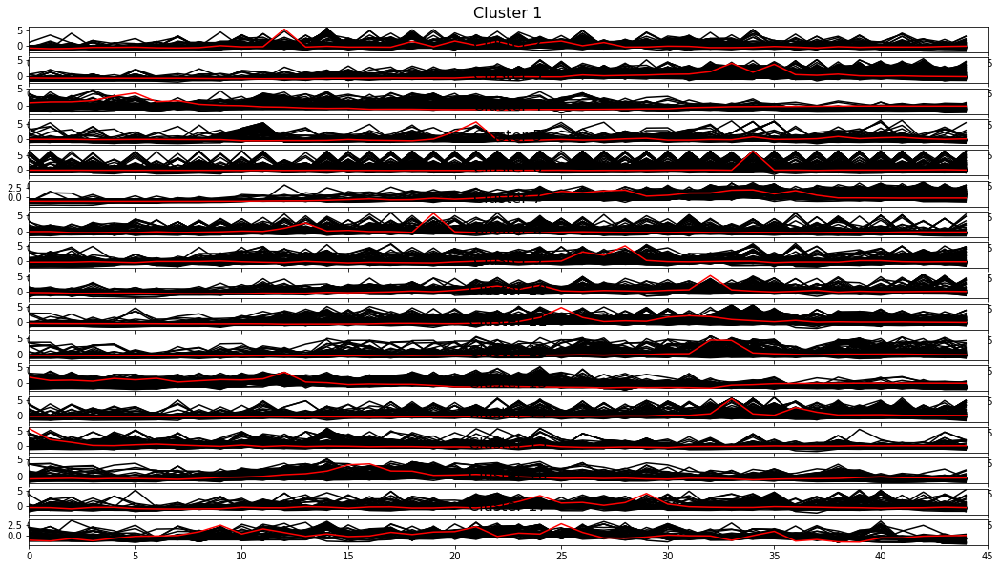

0.090 --> 0.075 --> 0.069 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.03865671673105682


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


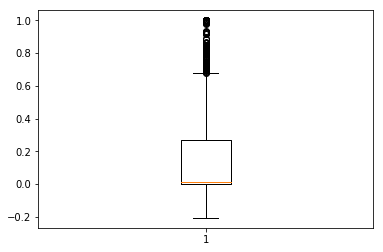

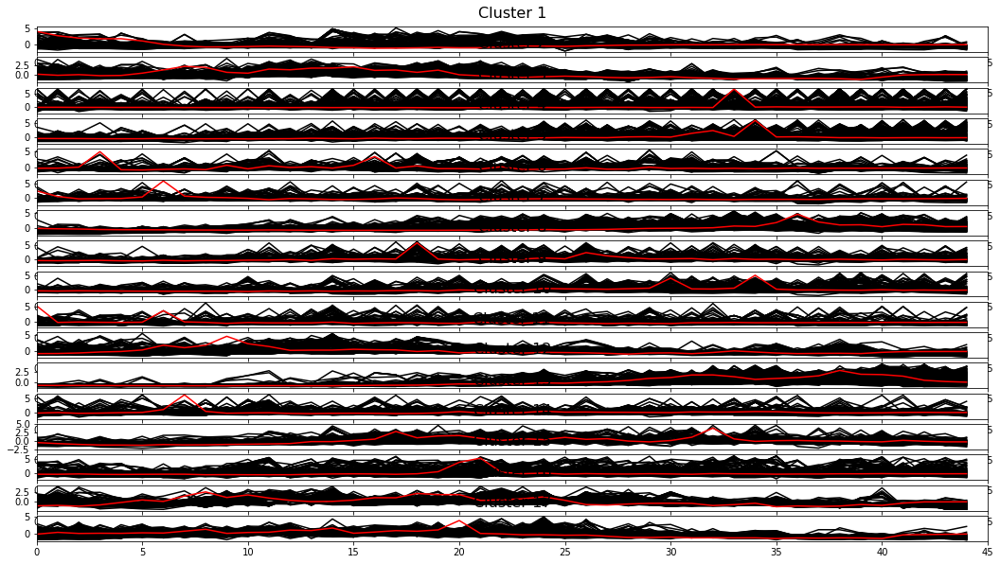

0.090 --> 0.079 --> 0.078 --> 0.073 --> 0.073 --> 0.075 --> 
For n_clusters = 17 The average silhouette_score is : -0.053795973794034335


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


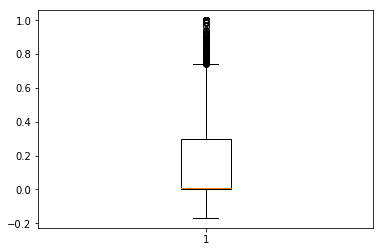

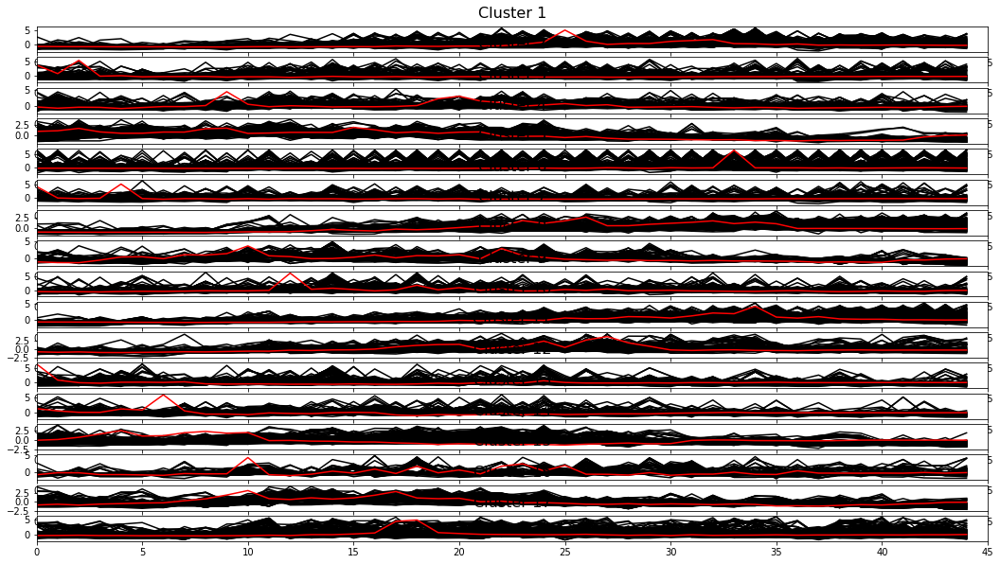

0.090 --> 0.075 --> 0.070 --> 0.067 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.04102427069142999


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


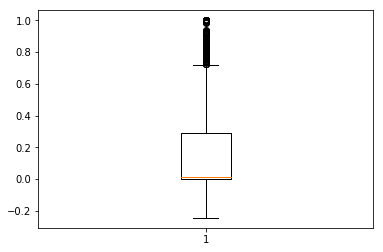

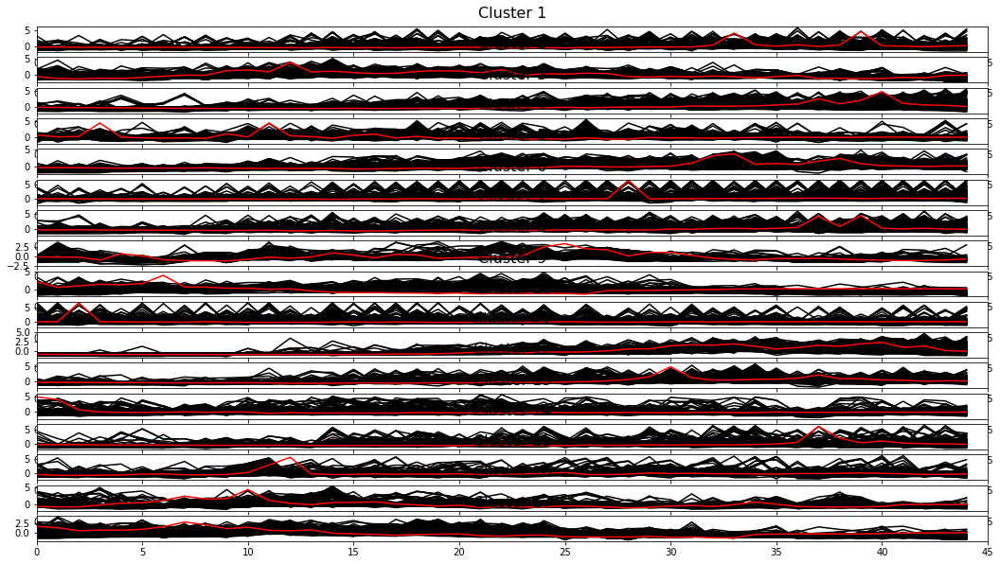

0.093 --> 0.075 --> 0.070 --> 0.068 --> 0.067 --> 0.067 --> 
For n_clusters = 17 The average silhouette_score is : -0.04184039812688716


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


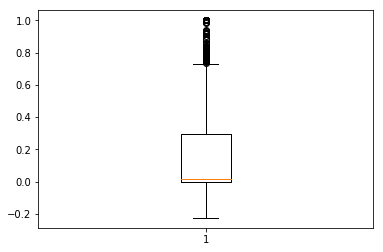

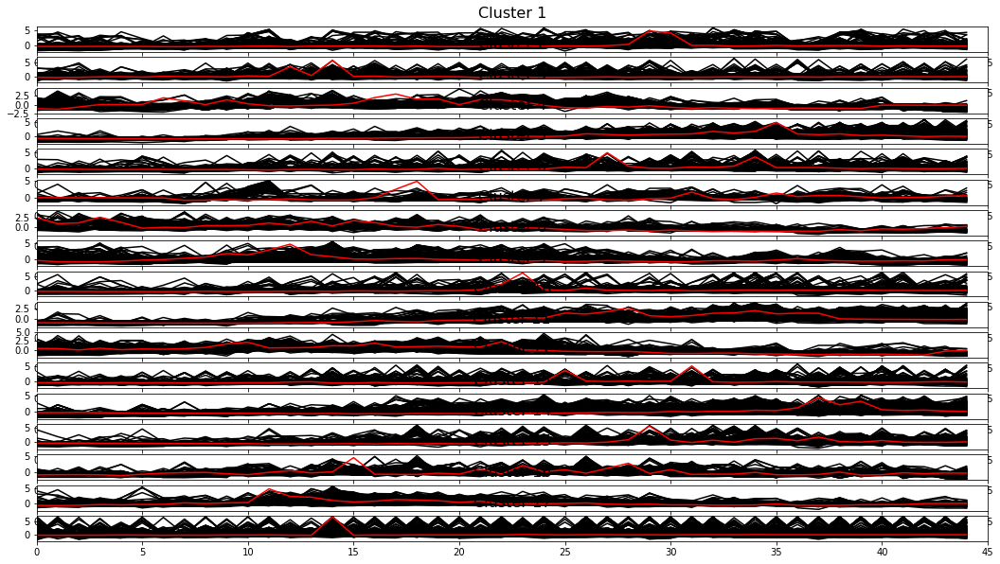

0.093 --> 0.076 --> 0.072 --> 0.070 --> 0.070 --> 0.070 --> 0.069 --> 0.069 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.046854134969094276


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


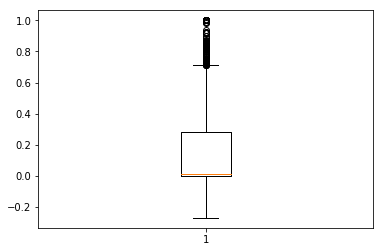

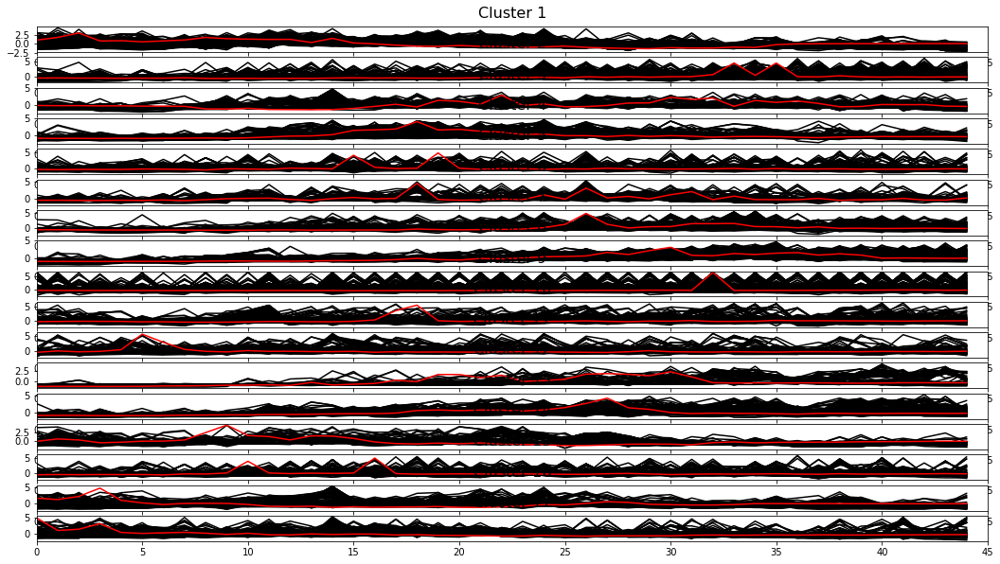

0.095 --> 0.076 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 0.070 --> 
For n_clusters = 17 The average silhouette_score is : -0.029090235538006708


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


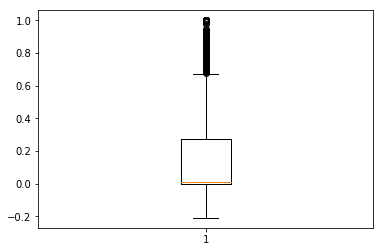

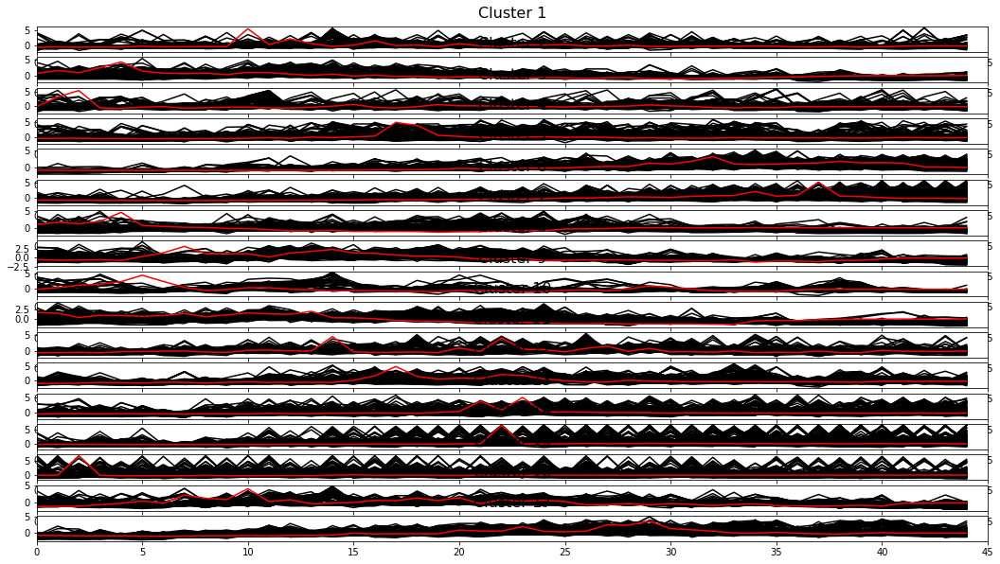

0.095 --> 0.076 --> 0.072 --> 0.071 --> 0.070 --> 0.070 --> 0.069 --> 0.069 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.0480671971259015


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


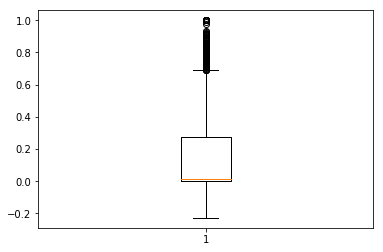

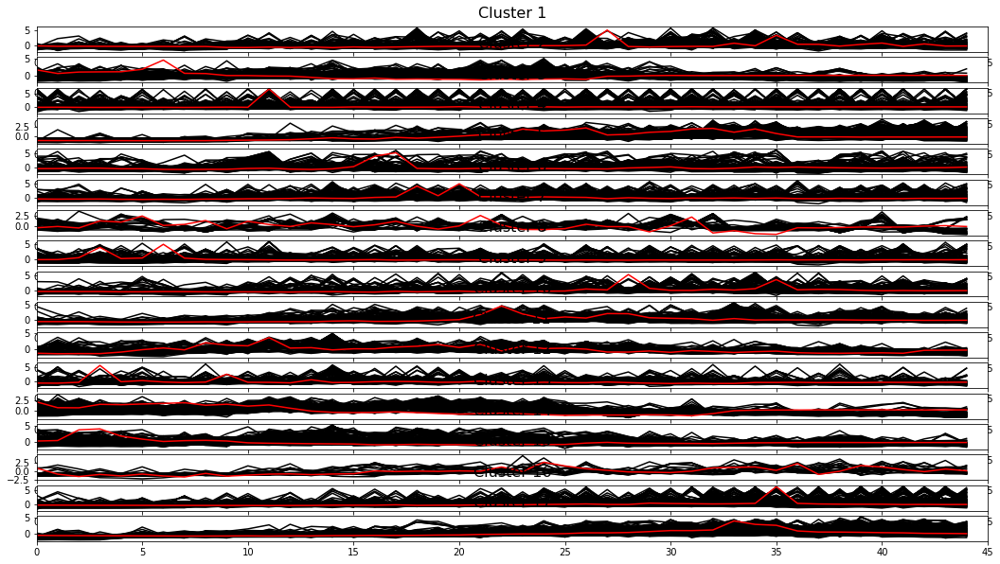

0.090 --> 0.076 --> 0.070 --> 0.068 --> 0.068 --> 
For n_clusters = 17 The average silhouette_score is : -0.03315419326841617


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


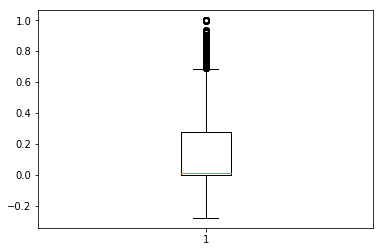

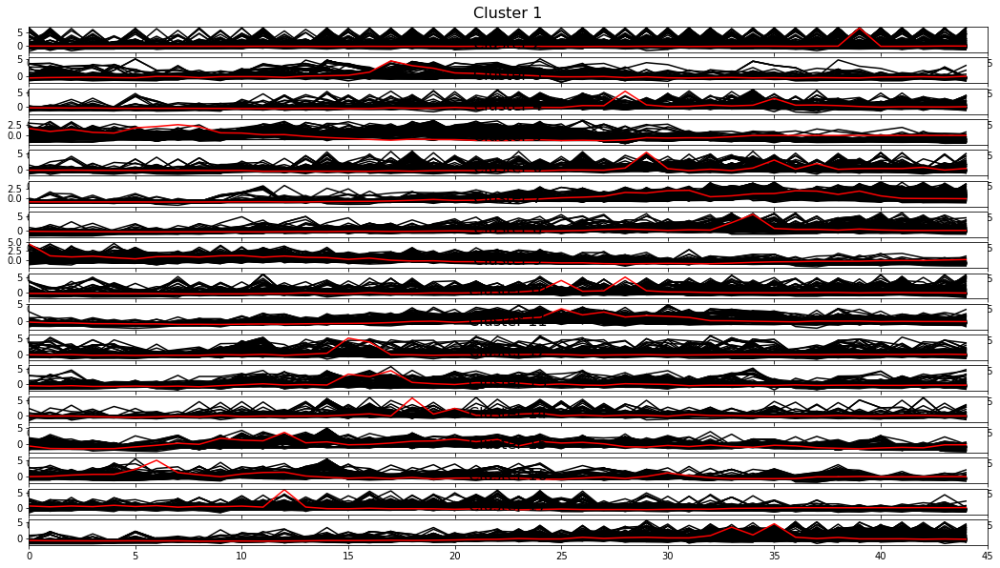

0.090 --> 0.077 --> 0.073 --> 0.072 --> 0.072 --> 
For n_clusters = 17 The average silhouette_score is : -0.035500779391081046


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


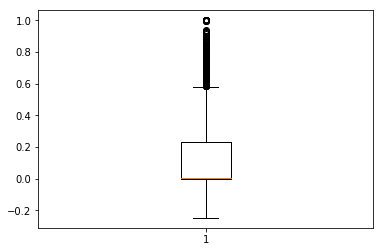

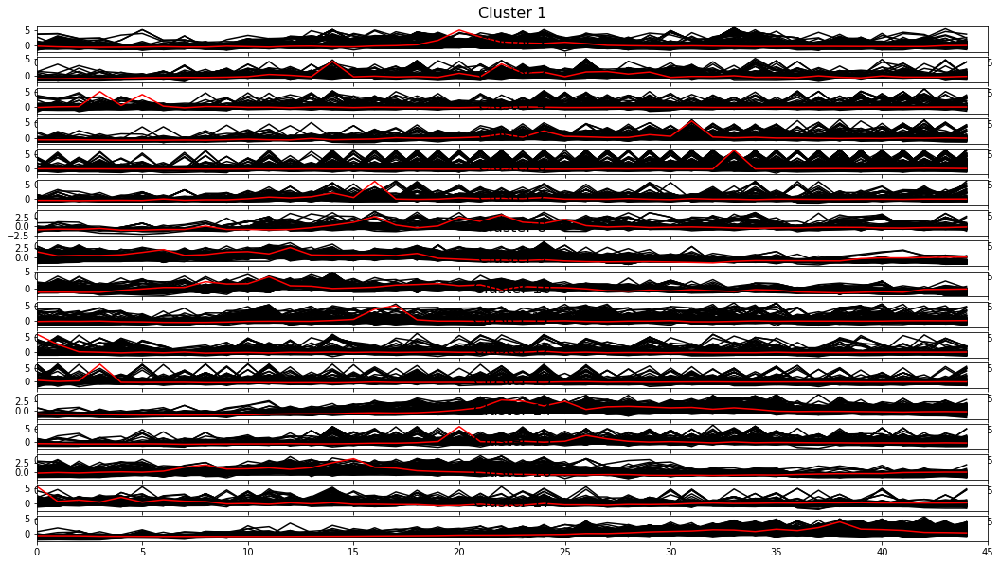

0.093 --> 0.078 --> 0.074 --> 0.071 --> 0.069 --> 0.069 --> 0.068 --> 0.069 --> 
For n_clusters = 17 The average silhouette_score is : -0.03913079071284866


/home/grecia/anaconda3/lib/python3.6/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


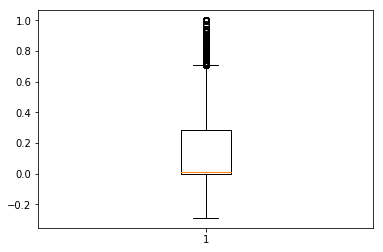

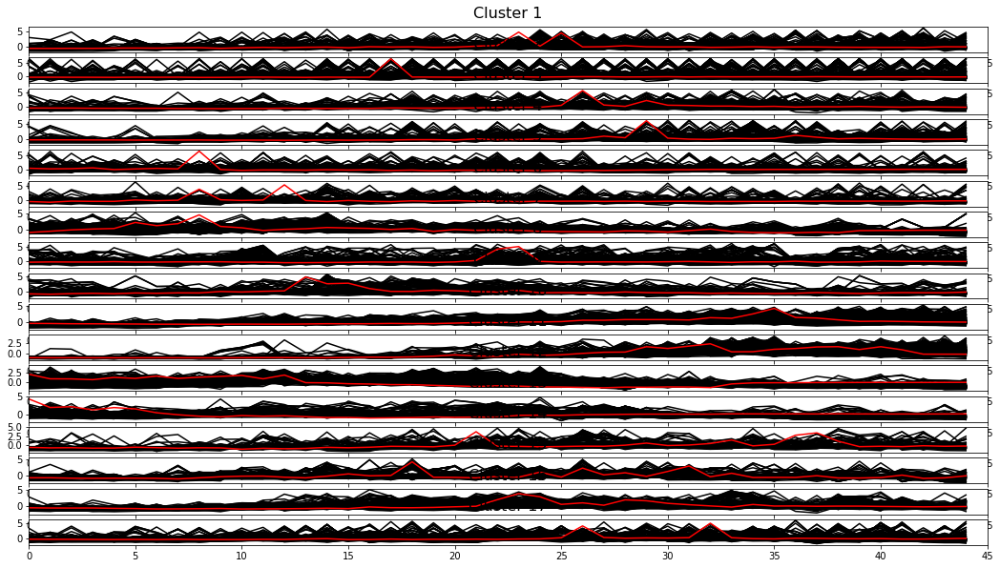

In [14]:
### Use k-shape to make partitions in data ###
'''We sill use k-shape with different initializations'''

num_cluster=17
num_base_clusterings=50
seeds=range(num_base_clusterings)

formatted_dataset = to_time_series_dataset(ts_item_ff)
X_train, sz = normalize_data(formatted_dataset)

#data frame to save silhouette scores from clusterings
silhouette_scores_df=pd.DataFrame(columns=['clustering','silhouette_score'])

#data frame to save the label clsuters
base_clusterings_df=pd.DataFrame(cross_ts_item_ff.index).rename({0: 'item_code.ff'}, axis='columns')

for seed in seeds:
    
    ks, y_pred = k_shape(X_train, n_clusters=num_cluster, seed=seed)
    scores = compute_scores(ks, X_train, y_pred)
    plt.boxplot(scores)
    silhouette= tslearn.clustering.silhouette_score(X_train, y_pred, metric="euclidean")
    silhouette_scores_df=silhouette_scores_df.append({'clustering':'clustering_'+ str(seed), 'silhouette_score':silhouette},ignore_index=True)
    print("For n_clusters =", num_cluster,
            "The average silhouette_score is :", silhouette)
    plot_data(ks, X_train, y_pred, sz, ks.n_clusters, centroid=True)
    base_clusterings_df['clustering_'+ str(seed)] = y_pred
    

In [16]:
#base_clusterings_df.to_csv('base_clusterings_df_17clusters.csv')

In [23]:
base_clusterings_df.head()

,item_ff,clustering_0,clustering_1,clustering_2,clustering_3,clustering_4,clustering_5,clustering_6,clustering_7,clustering_8,...,clustering_40,clustering_41,clustering_42,clustering_43,clustering_44,clustering_45,clustering_46,clustering_47,clustering_48,clustering_49
0,1.0,8,6,6,14,7,4,7,0,8,...,10,16,13,12,3,3,16,1,0,8
1,1.1,8,6,6,0,7,4,14,0,13,...,10,16,13,0,3,3,16,1,0,8
2,1.2,8,8,14,9,11,8,10,9,16,...,8,5,6,1,4,12,5,11,5,5
3,1.3,0,5,1,6,5,3,13,3,15,...,7,4,5,13,8,13,0,0,4,3
4,2.0,4,2,10,1,16,15,3,11,12,...,14,16,14,11,14,10,4,11,9,16


In [20]:
#Give to the base clusterings the array of arrays format that it is required by the ensemble function
base_clusterings_list=[]
for column in base_clusterings_df.columns[1:51]:
    base_clusterings_list.append(base_clusterings_df[column].values)

In [70]:
print('THE AVERAGE SILHOUETTE SCORE IN BASE CLUSTERINGS IS:',silhouette_scores_df[:50].mean() )

THE AVERAGE SILHOUETTE SCORE IN BASE CLUSTERINGS IS: silhouette_score   -0.042623
dtype: float64


## 3. Clustering Ensemble

In [57]:
### Use GMM_Voting ###
'''We will randomly take different number of base clusterings and check how well it works'''

import Clustering_Ensembles
import random

#list of number of base clusterings that we will give to the ensemble
M_base_clustering= np.arange(5, 55, 5)

#data frame to save silhouette scores from ensembles
silhouette_scores_ensembles_df=pd.DataFrame(columns=['iteration','num_base_clusterings','silhouette_score'])

#iterations is the number of times we will run the GMM_Voting ensemble
iterations=10

for i in range(iterations): 
    for M in M_base_clustering:

        base_clusterings_list_M=random.choices(base_clusterings_list, k=M)
        super_cluster=Clustering_Ensembles.do_ensemble(data='no', base_clustering=base_clusterings_list_M, iterations=20, consensus_function='GMM_Voting', ensembel_selection='no')
        base_clusterings_df['ensemble_'+ str(M)] = super_cluster
        silhouette= tslearn.clustering.silhouette_score(X_train, super_cluster, metric="euclidean")
        silhouette_scores_df=silhouette_scores_df.append({'clustering':'ensemble_'+ str(M), 'silhouette_score':silhouette},ignore_index=True)
        silhouette_scores_ensembles_df=silhouette_scores_ensembles_df.append({'iteration':i,'num_base_clusterings':M,'silhouette_score':silhouette},ignore_index=True)

Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 105.69it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 85.99it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 95.35it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 92.77it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 96.73it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 85.02it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 96.09it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 102.53it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 85%|████████▌ | 17/20 [00:00<00:00, 75.96it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 35%|███▌      | 7/20 [00:00<00:00, 67.78it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 77.58it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 121.58it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 129.80it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 116.07it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 116.75it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 100.55it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 102.13it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 102.72it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 92.31it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 101.83it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 90.22it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 94.99it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 106.24it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 97.82it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 81.62it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 45%|████▌     | 9/20 [00:00<00:00, 88.73it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 92.69it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 99.87it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 95.62it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 95.22it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 96.70it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 95.95it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 95%|█████████▌| 19/20 [00:00<00:00, 87.91it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 105.40it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 123.59it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 103.86it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 106.91it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 101.54it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 107.15it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 125.44it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 106.46it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 71.52it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 112.47it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 136.03it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 116.80it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 131.22it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 103.79it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 127.64it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 137.90it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 128.04it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 95.31it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 133.88it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 132.67it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 134.40it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 104.93it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 109.76it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 119.36it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 128.72it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 45%|████▌     | 9/20 [00:00<00:00, 88.32it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 132.10it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 50%|█████     | 10/20 [00:00<00:00, 99.85it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 108.16it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 133.46it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 103.81it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 103.06it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 125.57it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 122.63it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 116.46it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 103.51it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 111.74it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 79.86it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 128.78it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 125.25it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 70%|███████   | 14/20 [00:00<00:00, 138.51it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 107.28it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 108.24it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 114.25it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 112.69it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 77.54it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 116.88it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 72.53it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 90%|█████████ | 18/20 [00:00<00:00, 88.64it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 104.22it/s]


Number of base clusterings to be part in the Ensemble: 5
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 121.51it/s]


Number of base clusterings to be part in the Ensemble: 10
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 73.51it/s]


Number of base clusterings to be part in the Ensemble: 15
Number of maximum clusters in the Ensemble: 17


 40%|████      | 8/20 [00:00<00:00, 70.80it/s]


Number of base clusterings to be part in the Ensemble: 20
Number of maximum clusters in the Ensemble: 17


 60%|██████    | 12/20 [00:00<00:00, 119.00it/s]


Number of base clusterings to be part in the Ensemble: 25
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 103.24it/s]


Number of base clusterings to be part in the Ensemble: 30
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


Number of base clusterings to be part in the Ensemble: 35
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 121.01it/s]


Number of base clusterings to be part in the Ensemble: 40
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 92.78it/s]


Number of base clusterings to be part in the Ensemble: 45
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 127.48it/s]


Number of base clusterings to be part in the Ensemble: 50
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 106.38it/s]


In [58]:
#base_clusterings_df.to_csv('base_clusterings_ensembles_df_17clusters.csv')

In [59]:
#silhouette_scores_df.groupby(['clustering']).mean()

In [60]:
silhouette_scores_ensembles_df_mean=silhouette_scores_ensembles_df.groupby(['num_base_clusterings']).mean()
silhouette_scores_ensembles_df_mean

,iteration,silhouette_score
num_base_clusterings,,
5.0,4.5,-0.019335
10.0,4.5,-0.027303
15.0,4.5,-0.032454
20.0,4.5,-0.037945
25.0,4.5,-0.028170
30.0,4.5,-0.039405
35.0,4.5,-0.032977
40.0,4.5,-0.029138
45.0,4.5,-0.029866


Text(0, 0.5, 'Silhouette score')

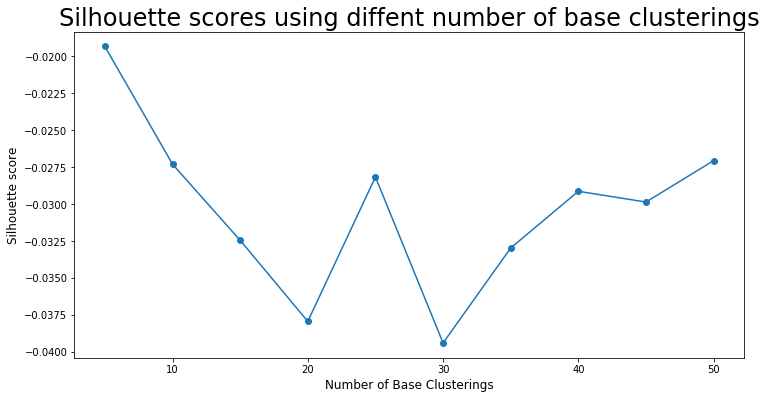

In [62]:
plt.figure(figsize=(12,6))
plt.plot( silhouette_scores_ensembles_df_mean.index, silhouette_scores_ensembles_df_mean.silhouette_score, marker = "o" )
plt.title('Silhouette scores using diffent number of base clusterings',fontsize=24)
plt.xlabel("Number of Base Clusterings", fontsize=12)
plt.ylabel("Silhouette score", fontsize=12)

Text(0.5, 1.0, 'GMM_Voting')

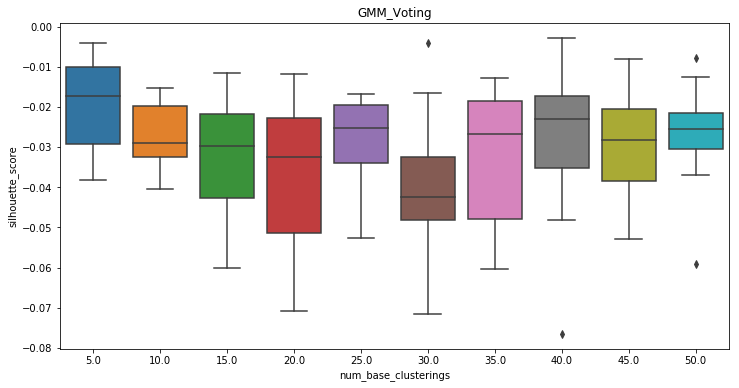

In [66]:
import seaborn as sns
plt.figure(figsize=(12,6))
sns.boxplot(x = 'num_base_clusterings', y = 'silhouette_score', data = silhouette_scores_ensembles_df).set_title("GMM_Voting")

In [72]:
#Ensemble using Clustering Ensemble Selection

#data frame to save silhouette scores from ensembles
silhouette_scores_ensembels_CES=[]
for i in range(iterations):
    super_cluster_ces=Clustering_Ensembles.do_ensemble(data=np.squeeze(X_train), base_clustering=np.squeeze(base_clusterings_list), iterations=20, consensus_function='GMM_Voting', ensembel_selection='yes')
    base_clusterings_df['ensemble_'+ 'CES'] = super_cluster_ces
    silhouette= tslearn.clustering.silhouette_score(X_train, super_cluster_ces, metric="euclidean")
    silhouette_scores_df=silhouette_scores_df.append({'clustering':'ensemble_'+ 'CES', 'silhouette_score':silhouette},ignore_index=True)
    silhouette_scores_ensembels_CES.append(silhouette)



/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 112.95it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/supervised.py:844: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


 45%|████▌     | 9/20 [00:00<00:00, 89.38it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metric

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/supervised.py:844: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 111.48it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


100%|██████████| 20/20 [00:00<00:00, 103.35it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


 55%|█████▌    | 11/20 [00:00<00:00, 101.20it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/supervised.py:844: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 121.43it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 125.68it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


 65%|██████▌   | 13/20 [00:00<00:00, 121.88it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metr

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: 

Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning: divide by zero encountered in true_divide
  score = (intra_dists[:, None] + intra_dists) / centroid_distances
/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluste

/home/grecia/anaconda3/lib/python3.6/site-packages/sklearn/metrics/cluster/supervised.py:844: FutureWarning: The behavior of NMI will change in version 0.22. To match the behavior of 'v_measure_score', NMI will use average_method='arithmetic' by default.
  FutureWarning)


Number of base clusterings to be part in the Ensemble: 19
Number of maximum clusters in the Ensemble: 17


  0%|          | 0/20 [00:00<?, ?it/s]


In [78]:
np.mean(silhouette_scores_ensembels_CES)

-0.032445229229868755

In [74]:
base_clusterings_df.to_csv('base_clusterings_ensembles_df_17clusters.csv')

## 4. Analysis in Clustering Ensemble

In [ ]:
from Ensembles import Voting_MM_GMM_torch

relabeled_clusters=Voting_MM_GMM_torch.relabel_cluster(list_ensembles)
vot_matrix=Voting_MM_GMM_torch.voting(relabeled_clusters)

vot_matrix


In [ ]:
from scipy import stats
sns.distplot(vot_matrix, fit=stats.norm, bins=20, kde=False,)